# OpenWeather Project- Group 3


### Group members:

Arad Choroomi – 03796762

Rui Liu – 03796764

Mohammad Jamshidi - 03800828

Farzad Zandi – 03786254

## 1. Introduction and Problem Statement

Understanding and predicting weather patterns is a cornerstone of various industries, including agriculture, transportation, energy, and urban planning. Accurate weather forecasting is vital for decision-making processes that influence both economic activities and public safety. The ability to anticipate temperature fluctuations, rainfall, and other meteorological variables enables optimized resource allocation, disaster preparedness, and efficient service delivery.

Weather prediction, a subset of time-series forecasting, has evolved over decades. Initially reliant on statistical methods such as ARIMA models, advancements in computational power and algorithmic designs have introduced more sophisticated machine learning models. Neural networks, particularly Long Short-Term Memory (LSTM) models, were widely adopted for their capacity to capture temporal dependencies. More recently, transformer-based architectures, originally developed for natural language processing, have demonstrated exceptional performance in handling sequential data, including time-series forecasting.

This study focuses on weather prediction for Cluj-Napoca, leveraging historical weather data collected from the OpenWeather API. The dataset spans January 1, 2008, to May 2023, encompassing approximately 139,394 hourly observations with variables such as temperature, humidity, wind speed, and pressure. This project aims to utilize cutting-edge machine learning and deep learning techniques to forecast key meteorological variables and assess their predictive accuracy.

**Problem Statement**

Predicting weather involves dealing with complex, dynamic, and interdependent systems. Temperature, the central focus of this study, is influenced by numerous environmental and atmospheric factors. The challenges include handling missing data, identifying influential variables, managing seasonal trends, and ensuring that predictive models generalize well across different temporal horizons.

Moreover, selecting suitable algorithms for this task is critical, as models must balance computational efficiency, accuracy, and robustness against noise and outliers. Traditional models like Extreme Gradient Boosting (XGBoost) provide robust baselines for tabular data but may struggle with longer-term temporal dependencies. Conversely, transformer-based models such as Autoformer and iTransformer excel at capturing intricate temporal patterns but require significant computational resources and careful tuning.

The overarching problem is to develop a reliable, scalable, and interpretable forecasting pipeline that not only predicts temperature accurately but also highlights the relative importance of contributing variables and model efficiency.

**Project Aim and Objectives**

The primary aim of this project is to develop a robust and efficient weather prediction model using a comprehensive dataset collected from Cluj-Napoca, Romania. 

By leveraging state-of-the-art machine learning algorithms and techniques, this project aims to forecast critical weather variables, with a focus on temperature, while providing insights into the patterns and trends observed over time. 

The analysis seeks to address the challenges posed by long-term time-series forecasting and evaluate the comparative performance of modern predictive techniques.

To achieve this aim, the project is structured around the following key objectives:

1- Data Exploration and Understanding

- Investigate the structure and characteristics of the dataset.
- Perform an exploratory data analysis (EDA) to identify temporal patterns, seasonal trends, and correlations among variables.
- Generate visualizations such as time-series plots, correlation heatmaps, and distribution histograms to extract meaningful insights.

2- Data Cleaning and Preparation

- Handle missing values using domain-relevant imputation techniques.
- Identify and treat outliers through robust statistical methods.
- Remove redundant or irrelevant features to enhance computational efficiency.
- Engineer new features, including cyclical transformations for time-related variables, to better capture seasonality and periodicity.

3- Feature Selection and Transformation

- Select key variables influencing temperature predictions based on statistical analysis and domain knowledge.
- Scale numerical features and encode categorical variables to prepare the dataset for different machine learning models.

4- Predictive Modeling

- Build and evaluate multiple machine learning models to forecast temperature and other weather parameters:
- Linear Regression for baseline comparisons.
- Random Forest for robust ensemble learning.
- XGBoost for state-of-the-art tabular data performance.
- Long Short-Term Memory (LSTM) for sequence-based data.
- Autoformer and iTransformer as advanced transformer-based models for long-term forecasting.
- Compare the models on regression (continuous temperature prediction) and classification tasks (weather categories).

5- Hyperparameter Tuning

- Fine-tune model parameters using RandomizedSearchCV and GridSearchCV to optimize performance.
- Assess the impact of hyperparameter adjustments on model accuracy, F1 score, and computational efficiency.

6- Model Evaluation and Insights

- Evaluate models using metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), accuracy, and F1 score.
- Analyze feature importances and the contribution of key variables to temperature predictions.
- Compare models based on scalability, generalization ability, and interpretability.

7- Applications and Future Directions

- Discuss potential applications of the developed models in real-world weather prediction scenarios.
- Suggest avenues for future research, including integrating additional data sources or employing newer architectures.

**Dataset Overview**

**Source**: This weather dataset for Cluj-Napoca, Romania, was scraped using the OpenWeatherMap API.

**Time Period**: Data spans from January 1, 2008, to May 2023 at an hourly rate, resulting in 139,394 entries.

**Attributes**: The dataset contains 28 columns (variables) describing various weather-related metrics (as detailed in the table you provided).

**Key Terminologies in the Dataset**

1.	Geographical Coordinates:
- `lat`: Latitude of the location. --> Interval
- `lon`: Longitude of the location. --> Interval
2.	Temperature Metrics:
- `temp`: Current temperature. --> Interval
- `temp_min`: Minimum temperature observed. --> Interval
- `temp_max`: Maximum temperature observed (optional) --> Interval
- `feels_like`: Temperature accounting for human perception (wind chill or humidity effects). --> Inerval
3.	Pressure and Humidity:
- `pressure`: Atmospheric pressure at sea level, measured in hPa (hectopascals). --> Interval
- `humidity`: Relative humidity as a percentage. --> Ratio
- `dew_point`: Temperature below which water vapor condenses into droplets. --> Interval
4.	Wind Metrics:
- `wind_speed`: Speed of wind in m/s. --> Interval
- `wind_deg`: Wind direction in degrees. --> Interval
- `wind_gust`: Maximum gust speed recorded. --> Interval
5.	Clouds and Visibility:
- `clouds_all`: Cloudiness in percentage. --> Ratio
- `visibility`: Average visibility in meters. --> Interval
6.	Precipitation:
- `rain_1h`: Rainfall in the past hour (mm). --> Interval
- `rain_3h`: Rainfall in the past 3 hours (mm). --> Interval
- `snow_1h`: Snowfall in the past hour (mm). --> Interval
- `snow_3h`: Snowfall in the past 3 hours (mm). --> Interval
7.	Weather Condition Indicators:
- `weather_id`: Unique identifier for specific weather conditions. --> Nominal
- `weather_main`: Main weather category (e.g., Rain, Snow, Clouds). --> Nominal
- `weather_description`: Detailed description of weather conditions (e.g., light snow, overcast clouds). --> Nomina
- `weather_icon`: Icon representing the weather. --> Nominal
8.	Date and Time:
- `dt`: Unix timestamp for the record. --> Interval
- `dt_iso`: Date and time in ISO 8601 format. --> Interval
- `timezone`: Offset in seconds from UTC. --> Interval


## 2. Importing Libraries

In [203]:
from datasets import load_dataset
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix
from pandas.plotting import parallel_coordinates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.utils.validation import check_is_fitted
from sklearn.exceptions import NotFittedError
import statsmodels.api as sm
import xgboost as xgb
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


: 

## 3. Loading the Dataset and Dataset Overview

In [204]:
# Loading the dataset
ds = load_dataset("LaurentiuStancioiu/Cluj-Napoca-Weather-OpenWeather-data")

If the dataset contains additional splits such as 'test' or 'validation', these might be ignored. Here we ensure that 'train' is the appropriate split for analysis.

In [205]:
# we converted the dataset to a pandas DataFrame while assuimg the dataset has a train split, to provide a tabular structure for easier manipulation and analysis.
df_weather = pd.DataFrame(ds['train'])

# Displaying the first few rows of the dataset
df_weather

,dt,dt_iso,timezone,city_name,lat,lon,temp,visibility,dew_point,feels_like,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1199145600,2008-01-01 00:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.46,4000.0,-10.40,-9.46,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
1,1199149200,2008-01-01 01:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.39,4000.0,-10.33,-9.39,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
2,1199152800,2008-01-01 02:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.39,4000.0,-10.33,-9.39,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
3,1199156400,2008-01-01 03:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.55,4000.0,-10.49,-9.55,...,NaN,NaN,NaN,NaN,0.1,100,804,Clouds,overcast clouds,04n
4,1199160000,2008-01-01 04:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.55,4000.0,-10.37,-9.55,...,NaN,NaN,NaN,NaN,NaN,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,1682967600,2023-05-01 19:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,12.61,10000.0,4.57,11.44,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139390,1682971200,2023-05-01 20:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,10.61,10000.0,5.58,9.58,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139391,1682974800,2023-05-01 21:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,10.07,10000.0,6.04,9.12,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139392,1682978400,2023-05-01 22:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,9.80,10000.0,6.70,9.80,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n


Getting and overview of the dataset, including the non-null count and data types of the columns

In [206]:
df = df_weather  # we made a copy of df_weather for further processing

df.info() # Displaying the dataset information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139394 entries, 0 to 139393
Data columns (total 28 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt                   139394 non-null  int64  
 1   dt_iso               139394 non-null  object 
 2   timezone             139394 non-null  int64  
 3   city_name            139394 non-null  object 
 4   lat                  139394 non-null  float64
 5   lon                  139394 non-null  float64
 6   temp                 139394 non-null  float64
 7   visibility           137498 non-null  float64
 8   dew_point            139391 non-null  float64
 9   feels_like           139394 non-null  float64
 10  temp_min             139394 non-null  float64
 11  temp_max             139394 non-null  float64
 12  pressure             139394 non-null  int64  
 13  sea_level            0 non-null       object 
 14  grnd_level           0 non-null       object 
 15  humidity         

We also extracted the `df.info()` manually in a form of a plot.

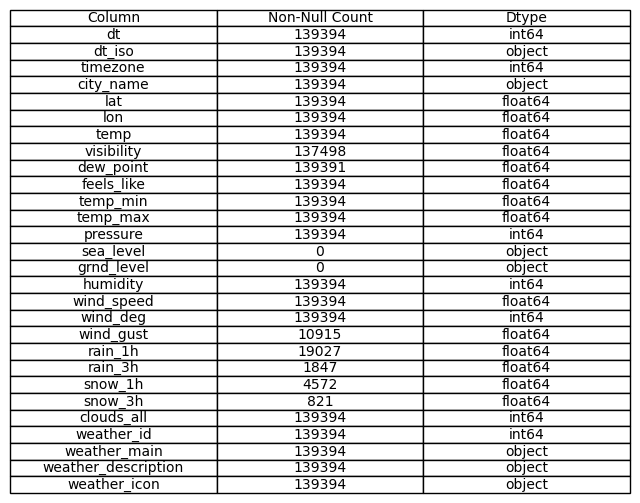

In [207]:
info = []

for col in df.columns:
    non_null_count = df[col].notnull().sum()
    dtype = df[col].dtype
    info.append([col, non_null_count, dtype])

# Create a DataFrame from the extracted info
df_info = pd.DataFrame(info, columns=["Column", "Non-Null Count", "Dtype"])

# Plotting the DataFrame as a table
plt.figure(figsize=(8, 3))
plt.axis('off')

plt.table(cellText=df_info.values, colLabels=df_info.columns, cellLoc='center', loc='center')
plt.savefig("data_overview.png", bbox_inches='tight')
plt.show()

### Data Checklists
***1. Data Accuracy***

According to the website, the data is a record of weather attributes by Cluj-Napoca, Romania, which was scraped using the OpenWeatherMap API. Therefore, with high confidence, we can say the data is accurate. We also perform further check in the data cleaning process, to see whether the values are correct and beling to the domain, to confirm Semantic and Syntatic accuracy.

***2. Data Uniqueness***

Each attribute assess a specific dimension of the weather condition, and we check for outliers and duplicates in the data cleaning process.

***3. Data Completeness***

We will check for missing data and address them accordingly.

***4. Data Relevance***

The first overview of the data shows that the database contains the vital attributes to perform predicting models.

***5. Data Timeliness***

The data reflects the realtime state of the weather conditions, therefore, its timeliness is confirmed here.

## 4. Data Cleaning and Preparation

**Step 1: Checking for duplicateed rows**

This code below checks if there are duplicate rows in the dataset, which should be address to avoid potentially biasing the analysis.

`df.duplicated()` returns a boolean Series indicating duplicate rows, and `.any()` confirms if at least one duplicate exists.

In [208]:
has_duplicates = df.duplicated().any()
print(f"Are there any duplicates? {has_duplicates}")

Are there any duplicates? False


We have also checked if the duplicates are legitimate (e.g., same weather conditions repeated for the same timestamp), and none of them are.

**Step 2: Dropping Columns with Only Null Values**

Two columns, `sea_level` and `grnd_level`, have entirely null values and are removed to declutter the dataset.

In [209]:
df = df.drop(columns=['sea_level', 'grnd_level'])

df # Display the dataset after dropping the columns

,dt,dt_iso,timezone,city_name,lat,lon,temp,visibility,dew_point,feels_like,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,1199145600,2008-01-01 00:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.46,4000.0,-10.40,-9.46,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
1,1199149200,2008-01-01 01:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.39,4000.0,-10.33,-9.39,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
2,1199152800,2008-01-01 02:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.39,4000.0,-10.33,-9.39,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
3,1199156400,2008-01-01 03:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.55,4000.0,-10.49,-9.55,...,NaN,NaN,NaN,NaN,0.1,100,804,Clouds,overcast clouds,04n
4,1199160000,2008-01-01 04:00:00 +0000 UTC,7200,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,-9.55,4000.0,-10.37,-9.55,...,NaN,NaN,NaN,NaN,NaN,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,1682967600,2023-05-01 19:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,12.61,10000.0,4.57,11.44,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139390,1682971200,2023-05-01 20:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,10.61,10000.0,5.58,9.58,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139391,1682974800,2023-05-01 21:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,10.07,10000.0,6.04,9.12,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139392,1682978400,2023-05-01 22:00:00 +0000 UTC,10800,Universitatea Babeș-Bolyai din Cluj-Napoca,46.767141,23.592139,9.80,10000.0,6.70,9.80,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n


**Step 3: Checking the number of unique values for each feature**

In [210]:
unique_counts = {column: df[column].nunique() for column in df.columns}
unique_counts

{'dt': 134400,
 'dt_iso': 134400,
 'timezone': 2,
 'city_name': 1,
 'lat': 1,
 'lon': 1,
 'temp': 4979,
 'visibility': 67,
 'dew_point': 4035,
 'feels_like': 5348,
 'temp_min': 4807,
 'temp_max': 4706,
 'pressure': 68,
 'humidity': 94,
 'wind_speed': 535,
 'wind_deg': 329,
 'wind_gust': 95,
 'rain_1h': 422,
 'rain_3h': 42,
 'snow_1h': 156,
 'snow_3h': 17,
 'clouds_all': 101,
 'weather_id': 34,
 'weather_main': 12,
 'weather_description': 36,
 'weather_icon': 18}

Columns like `city_name`, `lat`, and `lon` have a single unique value, contributing no variance to the dataset. Removing them avoids overcomplicating model inputs.

The `dt` column is dropped because it is redundant after `dt_iso` provides a timestamp in a more detailed format. We checked that no unique information is lost compared to `dt_iso`.

In [211]:
df = df.drop(columns=['city_name', 'lat',  'lon', 'dt'])

df # Display the dataset after dropping the columns

,dt_iso,timezone,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,humidity,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2008-01-01 00:00:00 +0000 UTC,7200,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,92,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
1,2008-01-01 01:00:00 +0000 UTC,7200,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,92,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
2,2008-01-01 02:00:00 +0000 UTC,7200,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,92,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
3,2008-01-01 03:00:00 +0000 UTC,7200,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,92,...,NaN,NaN,NaN,NaN,0.1,100,804,Clouds,overcast clouds,04n
4,2008-01-01 04:00:00 +0000 UTC,7200,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,93,...,NaN,NaN,NaN,NaN,NaN,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 19:00:00 +0000 UTC,10800,12.61,10000.0,4.57,11.44,12.04,13.42,1019,58,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139390,2023-05-01 20:00:00 +0000 UTC,10800,10.61,10000.0,5.58,9.58,9.85,11.83,1019,71,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139391,2023-05-01 21:00:00 +0000 UTC,10800,10.07,10000.0,6.04,9.12,8.59,11.83,1019,76,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139392,2023-05-01 22:00:00 +0000 UTC,10800,9.80,10000.0,6.70,9.80,7.48,11.83,1020,81,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n


**Step 4: Creating a ***data*** column and ***item*** column based on `dt_iso` and `timezone`**

`dt_iso`: Converts a string timestamp into Python’s datetime format. Removing "UTC" ensures compatibility with pandas.

`dt_iso_local`: Adjusts timestamps to the local timezone by adding the timezone offset.

`date and time`: Extracts the day of the year and hour of the day for cyclical analysis.

In [212]:
# Parsing dt_iso to datetime (ignoring the "+0000 UTC" part initially)
df['dt_iso'] = pd.to_datetime(df['dt_iso'].str.replace(' +0000 UTC', '', regex=False))

# We also adjust for the timezone as the dataset is in UTC
df['dt_iso_local'] = df['dt_iso'] + pd.to_timedelta(df['timezone'], unit='s')

# Extracting day of the year (1-365/366) and hour of the day (0-23)
df['date'] = df['dt_iso_local'].dt.dayofyear
df['time'] = df['dt_iso_local'].dt.hour

cols_to_move = ['dt_iso_local', 'date', 'time']
remaining_cols = [col for col in df.columns if col not in cols_to_move + ['dt_iso', 'timezone']]
df = df[cols_to_move + remaining_cols]

df # Display the resulting DataFrame

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2008-01-01 02:00:00,1,2,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
1,2008-01-01 03:00:00,1,3,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
2,2008-01-01 04:00:00,1,4,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,...,NaN,NaN,NaN,NaN,NaN,100,600,Snow,light snow,13n
3,2008-01-01 05:00:00,1,5,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,...,NaN,NaN,NaN,NaN,0.1,100,804,Clouds,overcast clouds,04n
4,2008-01-01 06:00:00,1,6,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,...,NaN,NaN,NaN,NaN,NaN,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,12.61,10000.0,4.57,11.44,12.04,13.42,1019,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139390,2023-05-01 23:00:00,121,23,10.61,10000.0,5.58,9.58,9.85,11.83,1019,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139391,2023-05-02 00:00:00,122,0,10.07,10000.0,6.04,9.12,8.59,11.83,1019,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n
139392,2023-05-02 01:00:00,122,1,9.80,10000.0,6.70,9.80,7.48,11.83,1020,...,NaN,NaN,NaN,NaN,NaN,0,800,Clear,sky is clear,01n


**Step 5: Handling missing values**

In [213]:
# Checking for the sum of missing counts
df.isna().sum()  

dt_iso_local                0
date                        0
time                        0
temp                        0
visibility               1896
dew_point                   3
feels_like                  0
temp_min                    0
temp_max                    0
pressure                    0
humidity                    0
wind_speed                  0
wind_deg                    0
wind_gust              128479
rain_1h                120367
rain_3h                137547
snow_1h                134822
snow_3h                138573
clouds_all                  0
weather_id                  0
weather_main                0
weather_description         0
weather_icon                0
dtype: int64

We can see from the results of `df.info().sum()` that we have many missing values, that we need to assess and address them accordingly.

**Tabulating the Sum of missing counts**

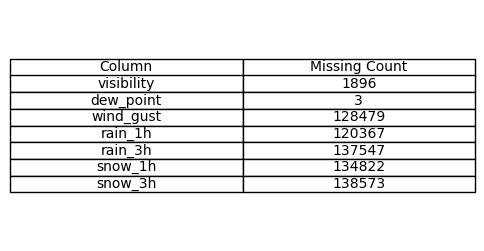

In [214]:
missing_counts = df.isna().sum()

# Filter to show only features with missing values
missing_data = missing_counts[missing_counts > 0].reset_index()
missing_data.columns = ['Column', 'Missing Count']

# Plotting the DataFrame as a table
plt.figure(figsize=(6, 3))
plt.axis('off')

table = plt.table(cellText=missing_data.values, colLabels=missing_data.columns, cellLoc='center', loc='center')
plt.savefig("missing_counts.png", bbox_inches='tight')
plt.show()

**Replacing missing values with `Zero`**

Columns `dew_point`, `wind_gust`, `rain_1h`, `rain_3h`, `snow_1h`, `snow_3h` are repalced by zero, as for the context of this dataset, missing means the lack of ocuurence for the specific weather condition. Hence, we decided to put zero for when the condition does not occur. 

visibility values are filled with the mean visibility grouped by `weather_description`, ensuring context-aware imputation. Using this method, instead of using 0 for missing values, we avoid ***misrepresenting sparse precipitation data***, which is a potential problem related to the cotext of this dataset.

In [215]:
# For column "dew_point", "wind_gust", "rain_1h", "rain_3h", "snow_1h" "snow_1h", replace NaN values with 0
df = df.copy()
df['dew_point'] = df['dew_point'].fillna(0)
df['wind_gust'] = df['wind_gust'].fillna(0)
df['rain_1h'] = df['rain_1h'].fillna(0)
df['rain_3h'] = df['rain_3h'].fillna(0)
df['snow_1h'] = df['snow_1h'].fillna(0)
df['snow_3h'] = df['snow_3h'].fillna(0)

# Display the resulting DataFrame
df

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2008-01-01 02:00:00,1,2,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
1,2008-01-01 03:00:00,1,3,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
2,2008-01-01 04:00:00,1,4,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
3,2008-01-01 05:00:00,1,5,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,...,0.0,0.0,0.0,0.0,0.1,100,804,Clouds,overcast clouds,04n
4,2008-01-01 06:00:00,1,6,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,...,0.0,0.0,0.0,0.0,0.0,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,12.61,10000.0,4.57,11.44,12.04,13.42,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139390,2023-05-01 23:00:00,121,23,10.61,10000.0,5.58,9.58,9.85,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139391,2023-05-02 00:00:00,122,0,10.07,10000.0,6.04,9.12,8.59,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139392,2023-05-02 01:00:00,122,1,9.80,10000.0,6.70,9.80,7.48,11.83,1020,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n


**Handling missing values of column "visibility"**

The case is different for the visibilty, as there is always some amount of visibility, so we replaced it with `mean`.

In [216]:
# Calculate the mean visibility for each weather_description
visibility_means = df.groupby('weather_description')['visibility'].mean()

# Fill missing visibility values using the mean of the respective weather_description
df['visibility'] = df['visibility'].fillna(
    df['weather_description'].map(visibility_means)
)

# Display the resulting DataFrame
df

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2008-01-01 02:00:00,1,2,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
1,2008-01-01 03:00:00,1,3,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
2,2008-01-01 04:00:00,1,4,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
3,2008-01-01 05:00:00,1,5,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,...,0.0,0.0,0.0,0.0,0.1,100,804,Clouds,overcast clouds,04n
4,2008-01-01 06:00:00,1,6,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,...,0.0,0.0,0.0,0.0,0.0,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,12.61,10000.0,4.57,11.44,12.04,13.42,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139390,2023-05-01 23:00:00,121,23,10.61,10000.0,5.58,9.58,9.85,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139391,2023-05-02 00:00:00,122,0,10.07,10000.0,6.04,9.12,8.59,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139392,2023-05-02 01:00:00,122,1,9.80,10000.0,6.70,9.80,7.48,11.83,1020,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n


In [217]:
df.isna().sum()  # Check again for missing counts

dt_iso_local           0
date                   0
time                   0
temp                   0
visibility             0
dew_point              0
feels_like             0
temp_min               0
temp_max               0
pressure               0
humidity               0
wind_speed             0
wind_deg               0
wind_gust              0
rain_1h                0
rain_3h                0
snow_1h                0
snow_3h                0
clouds_all             0
weather_id             0
weather_main           0
weather_description    0
weather_icon           0
dtype: int64

Lastly, we can see from our check that we have no missing values.

**Step 6: Detecting and Handling Outliers**

**Outlier Detection**: we used the Interquartile Range (IQR) method to identify extreme values. Data points beyond 1.5 times the IQR are flagged as outliers.

**Outlier Removal**: Specific thresholds are applied to remove implausible values, such as temperatures below -50°C or wind speeds exceeding 100 km/h.

In [218]:
df.describe() # Data summary statistics, as a first check for outliers

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id
count,139394,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000,139394.000000
mean,2015-08-26 03:38:29.806735104,180.402126,11.479655,9.618191,8702.795644,5.084552,8.529267,8.327400,12.116846,1016.121605,75.657396,2.390518,154.977940,0.393990,0.082628,0.024641,0.011844,0.005351,38.215605,728.715253
min,2008-01-01 02:00:00,1.000000,0.000000,-9998.770000,49.000000,-24.390000,-10005.770000,-9998.960000,-275.450000,-100.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,200.000000
25%,2011-10-25 13:15:00,86.000000,5.000000,2.240000,9999.000000,-0.450000,0.690000,0.840000,4.700000,1012.000000,62.000000,1.030000,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,701.000000
50%,2015-08-23 19:30:00,179.000000,11.000000,9.700000,10000.000000,5.150000,8.800000,8.450000,12.000000,1016.000000,81.000000,2.000000,130.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,800.000000
75%,2019-06-20 22:45:00,274.000000,17.000000,16.910000,10000.000000,11.350000,16.700000,15.750000,19.400000,1021.000000,93.000000,3.100000,270.000000,0.000000,0.000000,0.000000,0.000000,0.000000,75.000000,801.000000
max,2023-05-02 02:00:00,366.000000,23.000000,37.610000,10000.000000,25.190000,37.740000,37.000000,42.700000,1044.000000,100.000000,9999.000000,360.000000,24.200000,18.000000,27.000000,2.280000,9.000000,100.000000,804.000000
std,NaN,106.883893,6.927780,47.385004,2730.240737,7.568567,47.556514,47.396329,9.727896,8.178444,19.817223,26.828828,117.502033,1.668262,0.384762,0.408765,0.084294,0.109836,38.417129,121.070155


Before moving to validate the removal of outliers,  we Validate this decison via visualizations.

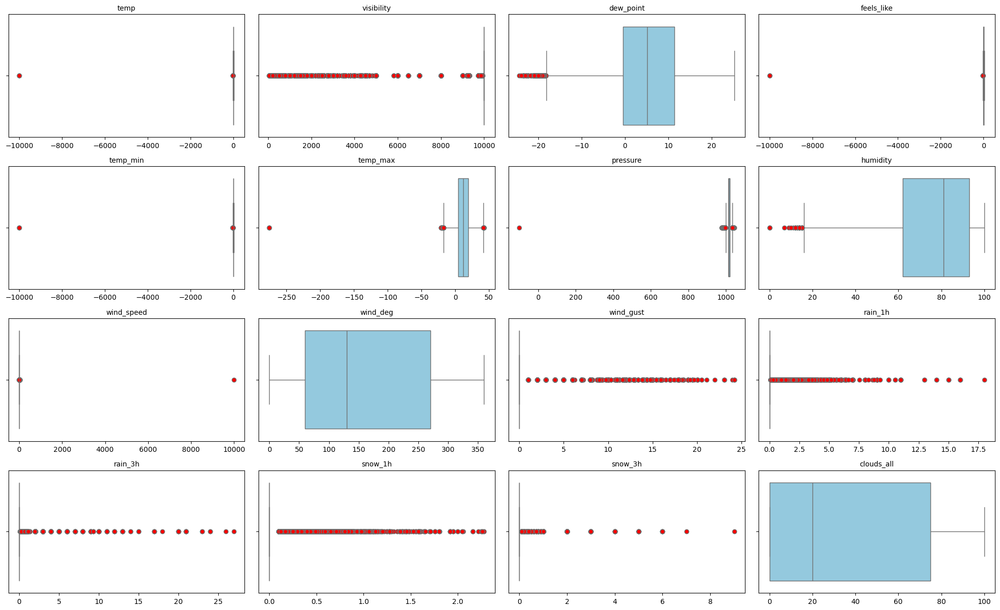

In [219]:
# Define numeric columns
numeric_cols = ['temp', 'visibility', 'dew_point', 'feels_like', 'temp_min',
                'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg',
                'wind_gust', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds_all']

# Plot boxplots separately for each variable
plt.figure(figsize=(20, 15))  # Adjust the overall figure size
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(5, 4, i)  # Arrange subplots in a grid (e.g., 5 rows x 4 columns)
    sns.boxplot(x=df[col], color='skyblue', flierprops=dict(markerfacecolor='red', marker='o'))
    plt.title(col, fontsize=10)
    plt.xlabel('')  # Remove x-axis label to keep it clean

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

After checking the outliers using the visualizations, we decided to further check the outliers using the IQR method to come up with the optimum decision abour addressing the ourtliers.

**Step 6.1: Detecting outliers for all numeric columns using IQR (Inter Quartile Range)**

In [220]:
def detect_outliers_iqr(df, numeric_cols):
    outliers = {}  # Dictionary to store outliers for each column

    for col in numeric_cols:
        Q1 = df[col].quantile(0.25)  # First quartile
        Q3 = df[col].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1  # Interquartile range

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Identifying outliers
        outliers[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]

        print(f"Column: {col}")
        print(f"Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")
        print(f"Outliers:\n{outliers[col]}\n")

    return outliers

# Calling the function with the numeric columns
outliers = detect_outliers_iqr(df, numeric_cols)

Column: temp
Lower Bound: -19.765, Upper Bound: 38.915
Outliers:
37292      -19.90
37293      -20.31
37294      -20.98
37295      -21.34
37296      -21.40
37297      -21.21
37315      -19.94
37316      -20.76
37317      -21.43
37318      -21.74
37319      -21.84
37320      -22.53
37321      -22.61
37322      -21.89
37323      -21.89
37340      -19.82
37341      -19.82
37342      -20.65
37343      -21.45
37344      -21.90
37345      -22.37
37346      -22.59
37347      -23.02
37348      -22.28
37524      -20.14
64114      -20.09
138339   -9998.77
138604   -9998.77
138804   -9998.77
Name: temp, dtype: float64

Column: visibility
Lower Bound: 9997.5, Upper Bound: 10001.5
Outliers:
0         4000.0
1         4000.0
2         4000.0
3         4000.0
4         4000.0
           ...  
139227    3600.0
139228    7000.0
139229    5000.0
139230    3000.0
139231    5000.0
Name: visibility, Length: 30941, dtype: float64

Column: dew_point
Lower Bound: -18.15, Upper Bound: 29.049999999999997
Outlier

The IQR (Interquartile Range) method identified several outliers across multiple weather variables. Key observations:

Temperature-related variables (`temp`, `feels_like`, `temp_min`, `temp_max`)

Extreme negative values such as -9998.77 and -275.45 indicate possible sensor errors or data corruption.
Outliers are primarily low temperatures, suggesting potential cold spikes or incorrect data logging.

Visibility: A significant number of outliers (30,941 instances) fall below the lower bound, indicating frequent occurrences of reduced visibility conditions due to weather factors.

Dew Point and Pressure: Outliers exist primarily on the lower end, suggesting extreme cold or low-pressure conditions.

Humidity and Wind Metrics: Instances of zero humidity could indicate sensor issues.
High wind speeds and gusts (e.g., values above 6.2 m/s) suggest extreme weather events.

Precipitation (rain_1h, rain_3h, snow_1h, snow_3h): Any non-zero value is considered an outlier by the IQR method, indicating periods of precipitation which should be further reviewed for meaningful trends rather than removal.

Cloud Cover (clouds_all): No outliers detected, suggesting consistent data distribution for cloudiness.

Regading both the results of the  summary statistics and the outliers analysis, we identify that `temp`, `feels_like`, `temp_min`, `temp_max`, `pressure`, `wind_speed` have unplausible values. 

Although there are many more outliers according to the IQR method, since they are very close to up/lower bound, or within a reasonable range, we don't simply drop them but instead, we analyze them further to determine their impact on the model's performance and treating them using data scaling.

In [221]:
# Defining the conditions for implausible values
conditions = (
    (df['temp'] < -50) | (df['temp'] > 50) |
    (df['feels_like'] < -50) | (df['feels_like'] > 50) |
    (df['temp_min'] < -50) | (df['temp_min'] > 50) |
    (df['temp_max'] < -50) | (df['temp_max'] > 50) |
    (df['pressure'] < 900) |
    (df['wind_speed'] > 100)
)

# Counting how many rows we need to drop
rows_to_drop_count = conditions.sum()
print(f"Number of rows to drop: {rows_to_drop_count}")

# Identifying the rows that we need to drop
rows_to_drop = df[conditions]
print("Rows to drop:")
display(rows_to_drop)

Number of rows to drop: 3
Rows to drop:


,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
138339,2023-03-20 17:00:00,79,17,-9998.77,9923.756375,0.0,-9998.77,-9998.96,-275.45,-100,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01d
138604,2023-03-31 17:00:00,90,17,-9998.77,9849.074209,0.0,-10005.77,-9998.96,-275.45,1008,...,0.0,0.0,0.0,0.0,0.0,40,802,Clouds,scattered clouds,03d
138804,2023-04-07 13:00:00,97,13,-9998.77,9270.674832,0.0,-9998.77,-9998.96,-275.45,1016,...,0.0,0.0,0.0,0.0,0.0,100,804,Clouds,overcast clouds,04d


In [222]:
# Dropping the above rows
df_cleaned = df[~conditions]

df_cleaned # Display the resulting DataFrame

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,wind_gust,rain_1h,rain_3h,snow_1h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2008-01-01 02:00:00,1,2,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
1,2008-01-01 03:00:00,1,3,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
2,2008-01-01 04:00:00,1,4,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,...,0.0,0.0,0.0,0.0,0.0,100,600,Snow,light snow,13n
3,2008-01-01 05:00:00,1,5,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,...,0.0,0.0,0.0,0.0,0.1,100,804,Clouds,overcast clouds,04n
4,2008-01-01 06:00:00,1,6,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,...,0.0,0.0,0.0,0.0,0.0,100,701,Mist,mist,50n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,12.61,10000.0,4.57,11.44,12.04,13.42,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139390,2023-05-01 23:00:00,121,23,10.61,10000.0,5.58,9.58,9.85,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139391,2023-05-02 00:00:00,122,0,10.07,10000.0,6.04,9.12,8.59,11.83,1019,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n
139392,2023-05-02 01:00:00,122,1,9.80,10000.0,6.70,9.80,7.48,11.83,1020,...,0.0,0.0,0.0,0.0,0.0,0,800,Clear,sky is clear,01n


## 5. Exploratory Data Analysis

### 5.1 Summary Table ###

The provided code performs statistical analysis on the dataset by computing summary statistics, skewness, and kurtosis, followed by visualizing the results in a table format. This process provides a comprehensive understanding of the dataset's distribution and potential anomalies.

The `df.describe()` function computes standard descriptive statistics for numerical columns in the DataFrame, including measures such as:
Count: Number of non-null values.

Mean: Average of values.

Standard Deviation (std): Dispersion of values around the mean.

Min, Max: The smallest and largest values.

25%, 50%, 75%: Quartile values representing the data spread.

The .transpose() function is used to swap rows and columns for better readability when displayed later.

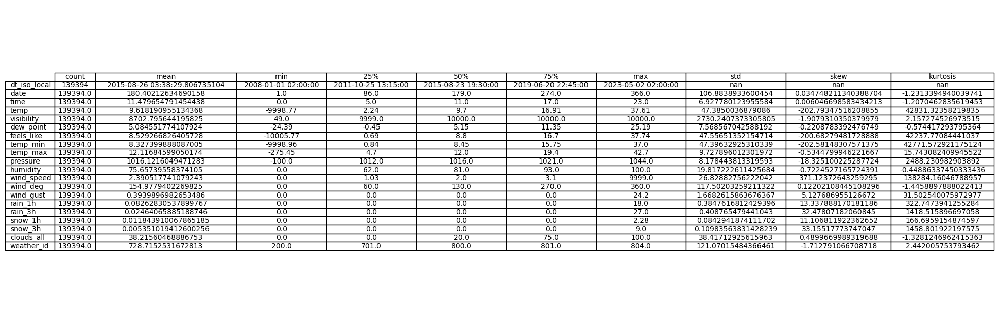

In [223]:
# Getting the summary statistics using df.describe() and transposing it
summary_stats = df.describe().transpose()

# Adding skewness and kurtosis for numeric columns only
numeric_cols = df.select_dtypes(include=[np.number]).columns
summary_stats['skew'] = df[numeric_cols].skew()
summary_stats['kurtosis'] = df[numeric_cols].kurtosis()

# Plotting the DataFrame as a table
plt.figure(figsize=(10, 8))  # Adjust the figure size for better readability
plt.axis('off')  # Turn off the axes

# Creating the table and add it to the plot
table = plt.table(cellText=summary_stats.values,
                  colLabels=summary_stats.columns,
                  rowLabels=summary_stats.index,
                  cellLoc='center',
                  loc='center')

# Automatically adjust font size and column width for better fit
table.auto_set_font_size(False)
table.set_fontsize(10)
table.auto_set_column_width(col=list(range(len(summary_stats.columns))))

# Save the table as a PNG image
plt.savefig("summary_statistics.png", bbox_inches='tight')
plt.show()

In [224]:
# Get the summary statistics using df.describe() and transpose it
summary_stats = df.describe().transpose()

# Select only numeric columns for additional statistics
numeric_cols = df.select_dtypes(include=[np.number]).columns

# Calculate additional statistics
summary_stats['skew'] = df[numeric_cols].skew()
summary_stats['kurtosis'] = df[numeric_cols].kurtosis()
summary_stats['25%'] = df[numeric_cols].quantile(0.25)
summary_stats['50%'] = df[numeric_cols].quantile(0.50)
summary_stats['75%'] = df[numeric_cols].quantile(0.75)

# Reorder columns for better readability
summary_stats = summary_stats[['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max', 'skew', 'kurtosis']]

# Round the specified columns to two decimal places
summary_stats[['mean', 'std', 'skew', 'kurtosis']] = summary_stats[['mean', 'std', 'skew', 'kurtosis']].round(2)

# Create a table using Plotly
fig = go.Figure(data=[go.Table(
    header=dict(values=['<b>Statistic</b>'] + list(summary_stats.columns),
                fill_color='paleturquoise',
                align='center',
                font=dict(size=12, color='black')),
    cells=dict(values=[summary_stats.index] + [summary_stats[col] for col in summary_stats.columns],
               fill_color='lavender',
               align='center',
               font=dict(size=11, color='black'))
)])

# Update layout for better readability
fig.update_layout(
    title_text='Detailed Summary Statistics',
    title_x=0.5,
    width=1400,  # Increase the width of the figure
    height=800
)

# Show the table
fig.show()

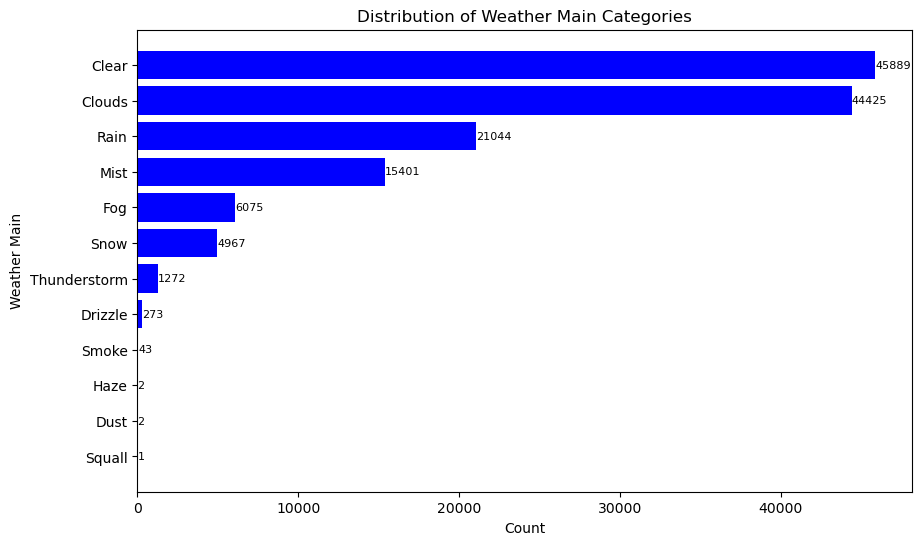

In [291]:
# 1. Plot horizontal bar chart for the target feature 'weather_main'

# Count the occurrences of each category and sort in descending order
weather_main_counts = df['weather_main'].value_counts()

# Create a horizontal bar chart
plt.figure(figsize=(10, 6))
bars = plt.barh(weather_main_counts.index, weather_main_counts.values, color='blue')

# Annotate each bar with the count
for bar in bars:
    plt.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2,
             str(int(bar.get_width())), va='center', fontsize=8)

# Customize the chart
plt.xlabel('Count')
plt.ylabel('Weather Main')
plt.title('Distribution of Weather Main Categories')
plt.gca().invert_yaxis()  # Invert y-axis to display the largest count at the top
plt.savefig('weather_main_distribution.png', bbox_inches='tight')
plt.show()

In [295]:
# Count the occurrences of each category and sort in descending order
weather_main_counts = df['weather_main'].value_counts()

# Create a horizontal bar chart using Plotly
fig = px.bar(
    weather_main_counts,
    x=weather_main_counts.values,
    y=weather_main_counts.index,
    orientation='h',
    labels={'x': 'Count', 'y': 'Weather Main'},
    title='Distribution of Weather Main Categories'
)

# Customize the chart
fig.update_layout(
    xaxis_title='Count',
    yaxis_title='Weather Main',
    yaxis=dict(autorange='reversed'),  # Invert y-axis to display the largest count at the top
    width=600,  # Set the width of the figure
    height=400  # Set the height of the figure
)

# Show the plot
fig.show()


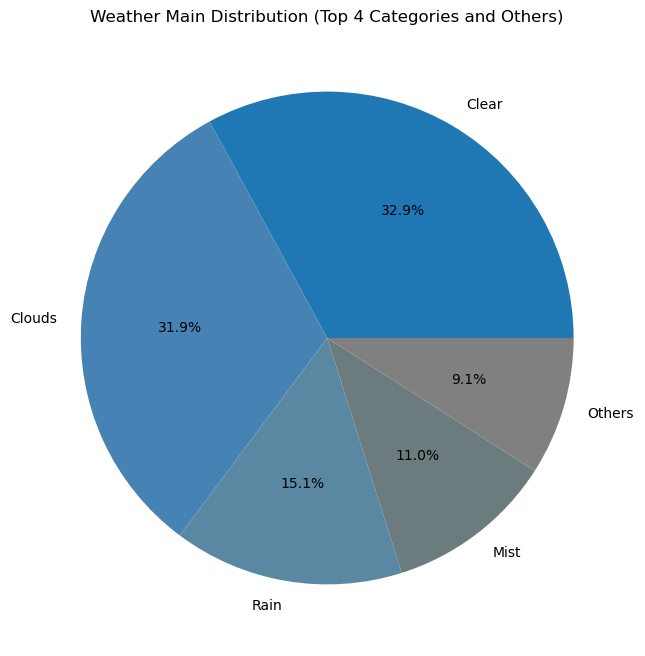

In [227]:
# 2. Plot pie chart for the target feature 'weather_main'

# Separate top 4 categories and group the rest as 'Others'
top_categories = weather_main_counts.head(4)  # Top 4 categories
others_count = weather_main_counts[4:].sum()  # Sum of all other categories

# Combine the top categories with 'Others'
pie_data = pd.concat([top_categories, pd.Series({'Others': others_count})])

# Define colors with a blue/grey theme
colors = ['#1f77b4', '#4682b4', '#5a88a3', '#6c7c7e', 'grey']

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    pie_data,
    labels=pie_data.index,
    autopct='%1.1f%%',  # Display percentages
    colors=colors,  # Assign colors, grey for "Others"
    explode=[0] * len(pie_data)  # No separation of pie pieces
)

# Customize the chart
plt.title('Weather Main Distribution (Top 4 Categories and Others)')
plt.show()

**Time Series Visualizations**

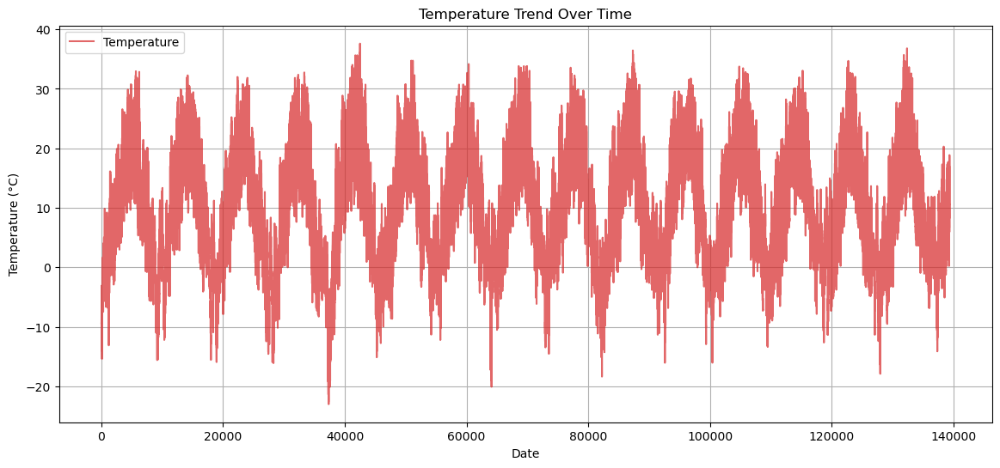

In [228]:
# Temperature Trend Over Time
plt.figure(figsize=(14, 6))
plt.plot(df_cleaned['temp'], label='Temperature', color='tab:red', alpha=0.7)
plt.title('Temperature Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.grid(True)
plt.legend()
plt.savefig('temperature_trend.png', dpi=300)
plt.show()

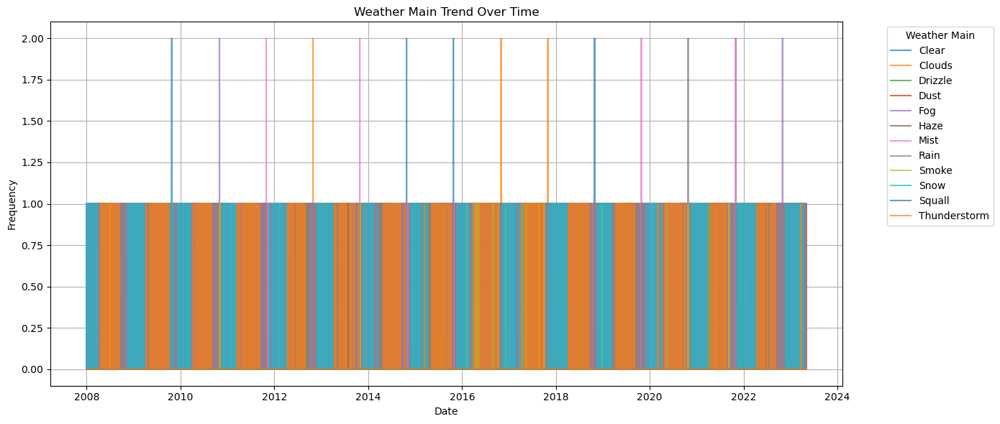

In [229]:
# Plotting the trend of weather_main over time
plt.figure(figsize=(14, 6))

# Group by date and weather_main, then count occurrences
weather_trend = df_cleaned.groupby(['dt_iso_local', 'weather_main']).size().unstack(fill_value=0)

# Plot each weather category trend
for column in weather_trend.columns:
    plt.plot(weather_trend.index, weather_trend[column], label=column, alpha=0.7)

plt.title('Weather Main Trend Over Time')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.grid(True)
plt.legend(title='Weather Main', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

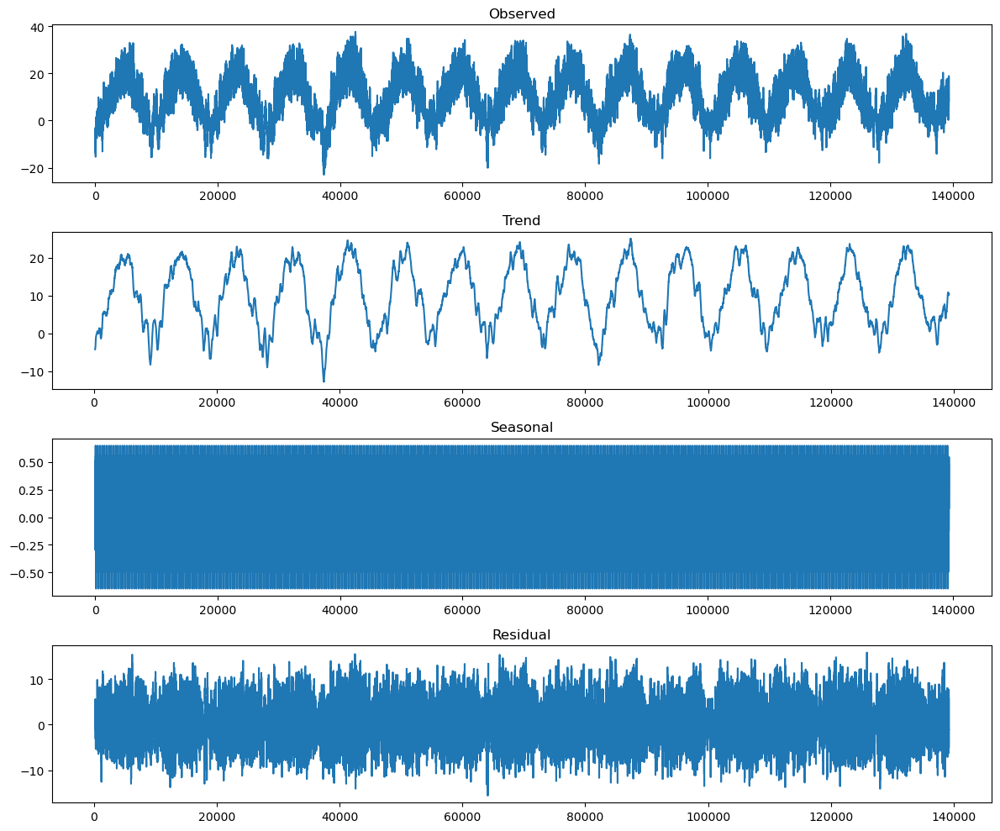

In [230]:
# Seasonal Decomposition of Temperature
decomposition = sm.tsa.seasonal_decompose(df_cleaned['temp'], model='additive', period=365)
fig, axes = plt.subplots(4, 1, figsize=(12, 10))
decomposition.observed.plot(ax=axes[0], title='Observed')
decomposition.trend.plot(ax=axes[1], title='Trend')
decomposition.seasonal.plot(ax=axes[2], title='Seasonal')
decomposition.resid.plot(ax=axes[3], title='Residual')
plt.tight_layout()
plt.show()

C:\Users\RSKALA\AppData\Local\Temp\ipykernel_6880\4107407093.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



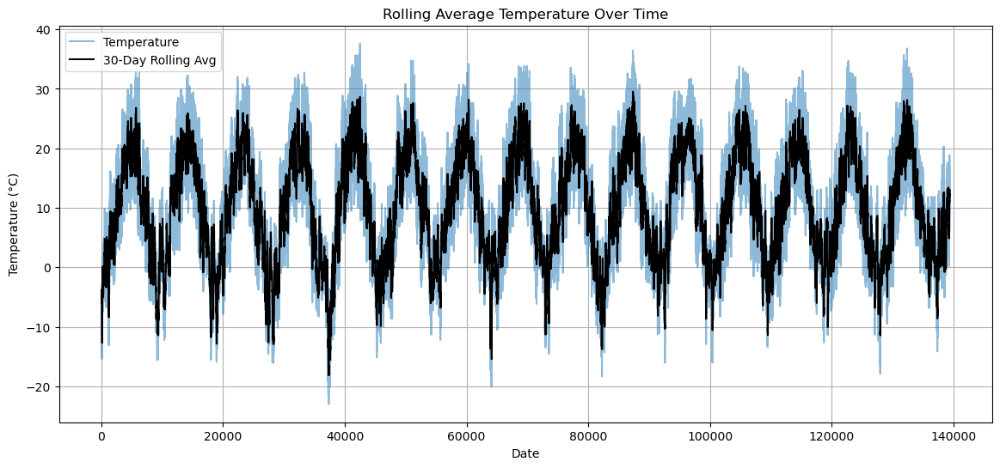

In [231]:
# Rolling Averages to smooth temperature
df_cleaned['temp_rolling'] = df_cleaned['temp'].rolling(window=30).mean()
plt.figure(figsize=(14, 6))
plt.plot(df_cleaned['temp'], label='Temperature', alpha=0.5)
plt.plot(df_cleaned['temp_rolling'], label='30-Day Rolling Avg', color='black')
plt.title('Rolling Average Temperature Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.grid(True)
plt.savefig('rolling_avg_temperature.png', dpi=300)
plt.show()

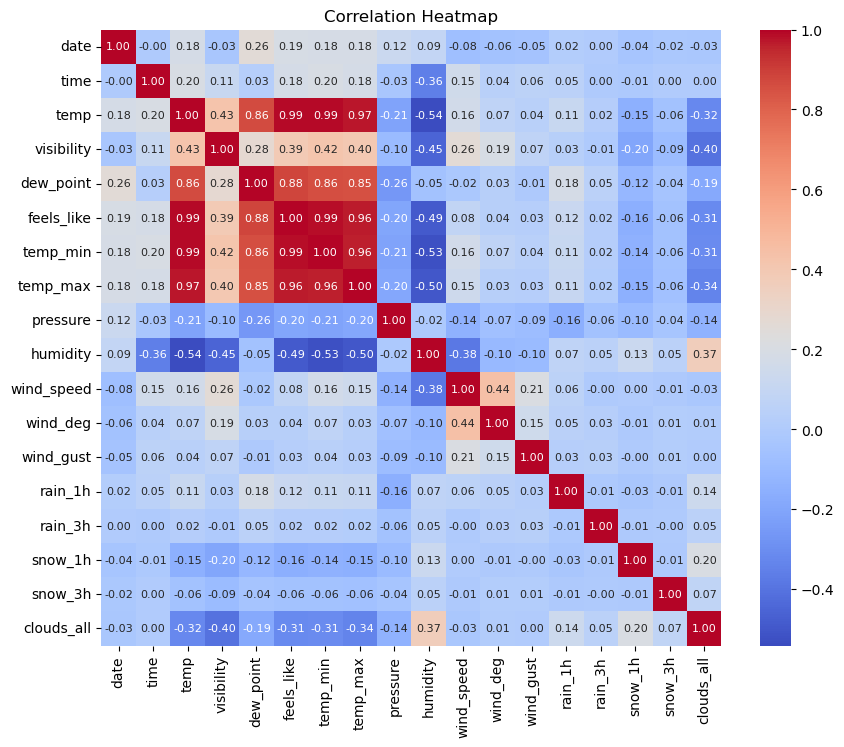

In [232]:
# 3. Plot heatmap for all input (numeric) features

# List input columns
input_cols = ['date', 'time', 'temp', 'visibility', 'dew_point', 'feels_like', 'temp_min',
                'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg',
                'wind_gust', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds_all']

df_input = df_cleaned[input_cols]  # df_input only consists of input columns

corr_input = df_input.corr() # Compute the correlation matrix

plt.figure(figsize=(10, 8))  # Optional: adjust the size of the plot
sns.heatmap(corr_input, annot=True, annot_kws={"size": 8}, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Correlation Heatmap')
plt.savefig('correlation_heatmap.png', dpi=300)
plt.show()

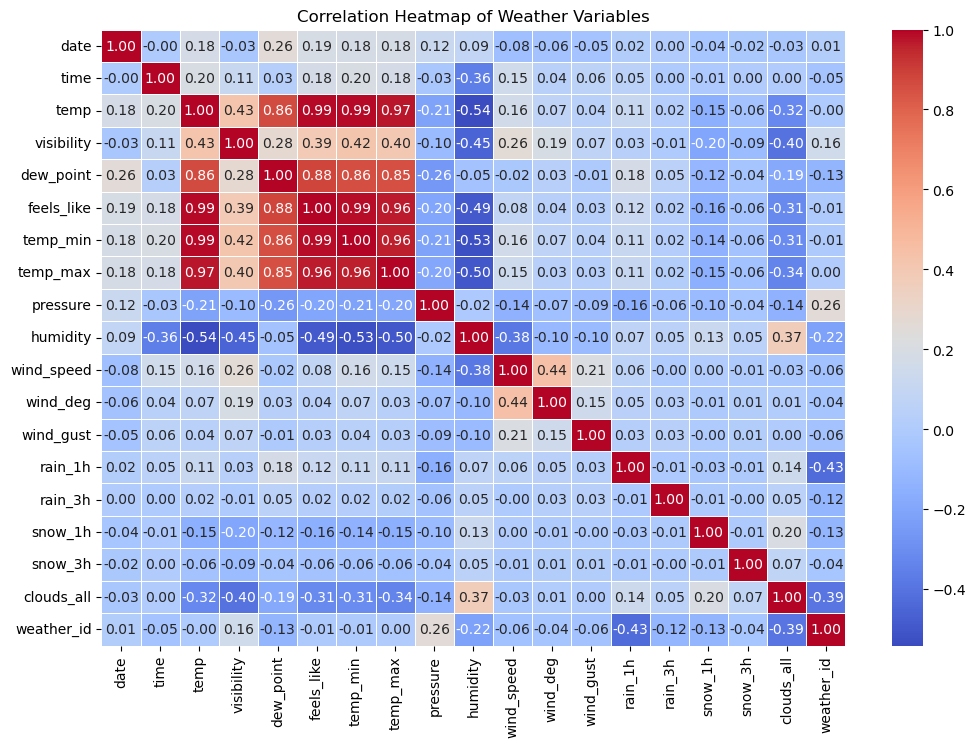

In [233]:
plt.figure(figsize=(12, 8))
sns.heatmap(df_cleaned[numeric_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Weather Variables')
plt.savefig('correlation_heatmap.png', dpi=300)
plt.show()

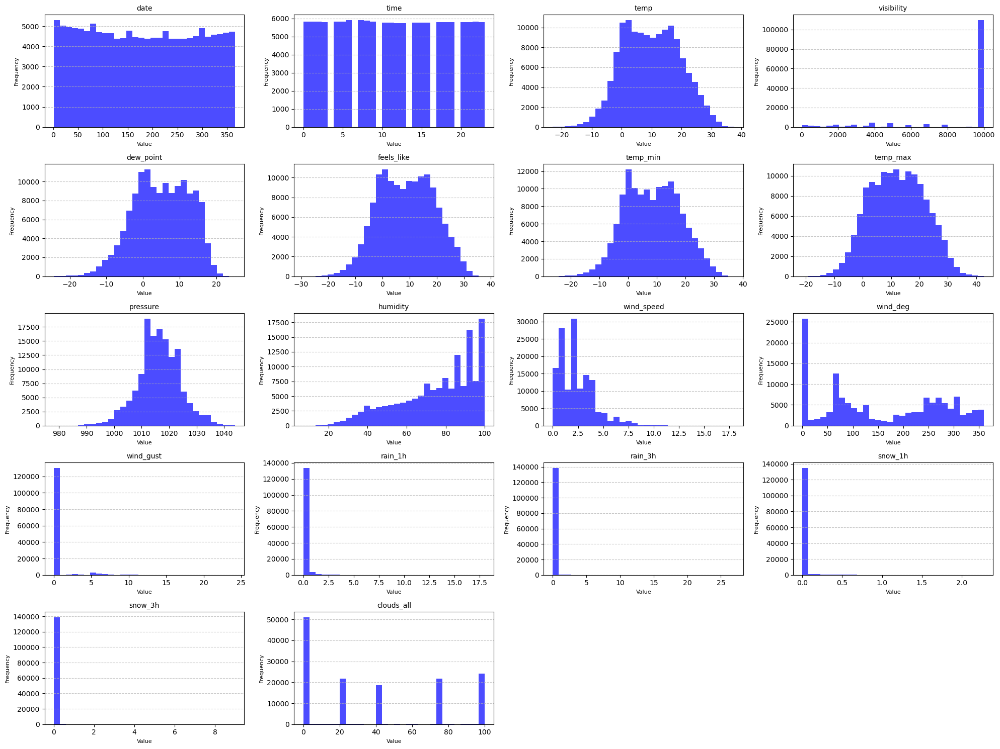

In [234]:
# 4. Plot histograms for all input (numeric) features

plt.figure(figsize=(20, 15))  # Adjust the overall figure size
for i, col in enumerate(df_input.columns, 1):
    plt.subplot(5, 4, i)  # Arrange subplots in a grid (e.g., 5 rows x 4 columns)
    plt.hist(df_input[col].dropna(), bins=30, color='blue', alpha=0.7)  # Drop NaN values for histogram
    plt.title(col, fontsize=10)
    plt.xlabel('Value', fontsize=8)
    plt.ylabel('Frequency', fontsize=8)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig('input_columns_histograms.png', dpi=300)
plt.show()

**Histogram with Density Plot**

In [235]:
"""plt.figure(figsize=(20, 15))
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(5, 4, i)
    sns.histplot(df_cleaned[col], kde=True, color='blue')
    plt.title(col)
    plt.xlabel('Value')
    plt.ylabel('Density')
plt.tight_layout()
plt.savefig('histogram_density_plots.png', dpi=300)
plt.show()"""

"plt.figure(figsize=(20, 15))\nfor i, col in enumerate(numeric_cols, 1):\n    plt.subplot(5, 4, i)\n    sns.histplot(df_cleaned[col], kde=True, color='blue')\n    plt.title(col)\n    plt.xlabel('Value')\n    plt.ylabel('Density')\nplt.tight_layout()\nplt.savefig('histogram_density_plots.png', dpi=300)\nplt.show()"

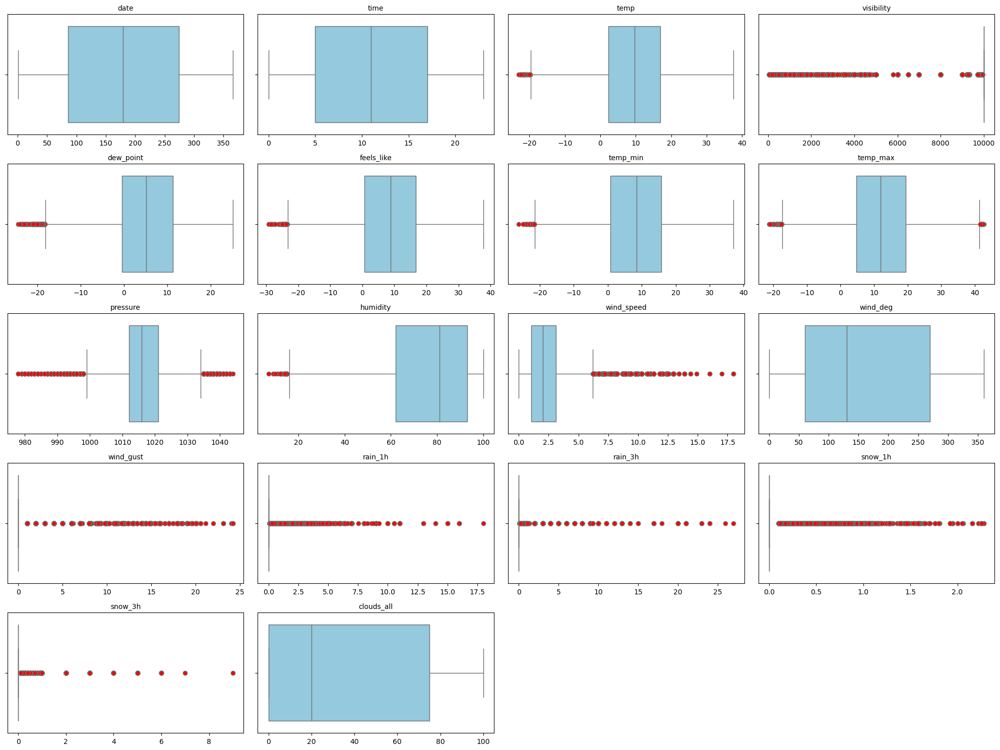

In [236]:
# 5. Plot boxplots for all input (numeric) features

# Create subplots for boxplots
plt.figure(figsize=(20, 15))  # Adjust the figure size
for i, col in enumerate(input_cols, 1):
    plt.subplot(5, 4, i)  # Arrange in a grid (e.g., 5 rows x 4 columns)
    sns.boxplot(x=df_input[col], color='skyblue', flierprops={"markerfacecolor": "red", "marker": "o"})
    # Boxplot for each feature and show outliers in a different color
    plt.title(col, fontsize=10)  # Set title for each subplot
    plt.xlabel('')  # Remove x-axis label to keep it clean

plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig('input_columns_boxplots.png', dpi=300)
plt.show()

In [297]:
'''# Boxplot Comparison for Major Metrics
fig = px.box(df_cleaned, y=['temp', 'humidity', 'wind_speed', 'pressure'],
             title='Boxplot Comparison of Key Weather Metrics')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("boxplot_key_metrics.html")'''

'# Boxplot Comparison for Major Metrics\nfig = px.box(df_cleaned, y=[\'temp\', \'humidity\', \'wind_speed\', \'pressure\'],\n             title=\'Boxplot Comparison of Key Weather Metrics\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("boxplot_key_metrics.html")'

**Enhanced Violin Plots using Plotly**

In [238]:
"""fig = px.violin(df_cleaned, y='temp', x='weather_main', box=True, points="all", 
                title='Temperature Distribution by Weather Category', color='weather_main')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("violin_temp_by_weather.html")

fig = px.violin(df_cleaned, y='wind_speed', x='weather_main', box=True, points="all", 
                title='Wind Speed Distribution by Weather Category', color='weather_main')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("violin_wind_by_weather.html")"""

'fig = px.violin(df_cleaned, y=\'temp\', x=\'weather_main\', box=True, points="all", \n                title=\'Temperature Distribution by Weather Category\', color=\'weather_main\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("violin_temp_by_weather.html")\n\nfig = px.violin(df_cleaned, y=\'wind_speed\', x=\'weather_main\', box=True, points="all", \n                title=\'Wind Speed Distribution by Weather Category\', color=\'weather_main\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("violin_wind_by_weather.html")'

In [296]:
'''# Violin plot for clouds_all by weather_main
fig = px.violin(df_cleaned, y='clouds_all', x='weather_main', box=True, points="all", 
                title='Cloud Cover Distribution by Weather Category', color='weather_main')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("violin_clouds_all_by_weather.html")

# Violin plot for visibility by weather_main
fig = px.violin(df_cleaned, y='visibility', x='weather_main', box=True, points="all", 
                title='Visibility Distribution by Weather Category', color='weather_main')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("violin_visibility_by_weather.html")

# Violin plot for rain_1h by weather_main
fig = px.violin(df_cleaned, y='rain_1h', x='weather_main', box=True, points="all", 
                title='Rainfall (1h) Distribution by Weather Category', color='weather_main')
fig.update_layout(width=1000, height=600)
fig.show()
fig.write_html("violin_rain_1h_by_weather.html")'''

'# Violin plot for clouds_all by weather_main\nfig = px.violin(df_cleaned, y=\'clouds_all\', x=\'weather_main\', box=True, points="all", \n                title=\'Cloud Cover Distribution by Weather Category\', color=\'weather_main\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("violin_clouds_all_by_weather.html")\n\n# Violin plot for visibility by weather_main\nfig = px.violin(df_cleaned, y=\'visibility\', x=\'weather_main\', box=True, points="all", \n                title=\'Visibility Distribution by Weather Category\', color=\'weather_main\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("violin_visibility_by_weather.html")\n\n# Violin plot for rain_1h by weather_main\nfig = px.violin(df_cleaned, y=\'rain_1h\', x=\'weather_main\', box=True, points="all", \n                title=\'Rainfall (1h) Distribution by Weather Category\', color=\'weather_main\')\nfig.update_layout(width=1000, height=600)\nfig.show()\nfig.write_html("violin_r

**Scatter Matrix for Numeric Variables**

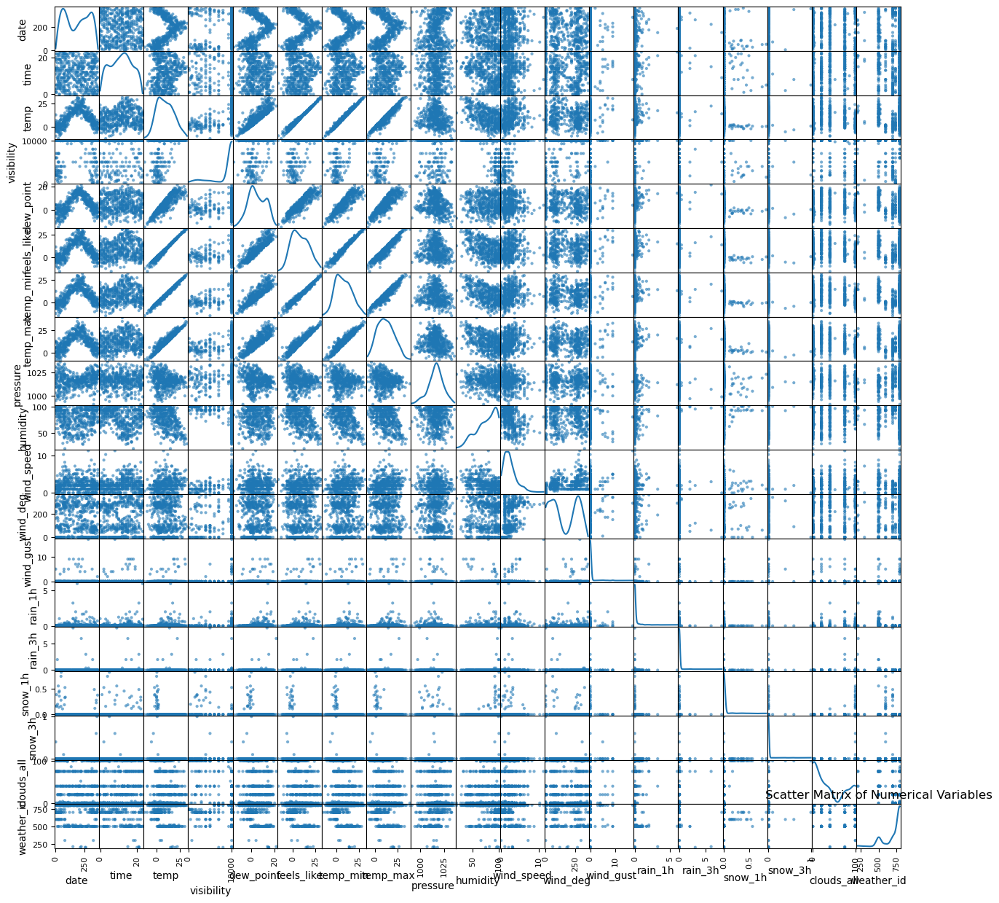

In [239]:
scatter_matrix(df_cleaned[numeric_cols].sample(500), figsize=(15, 15), alpha=0.6, diagonal='kde')
plt.title('Scatter Matrix of Numerical Variables')
plt.show()

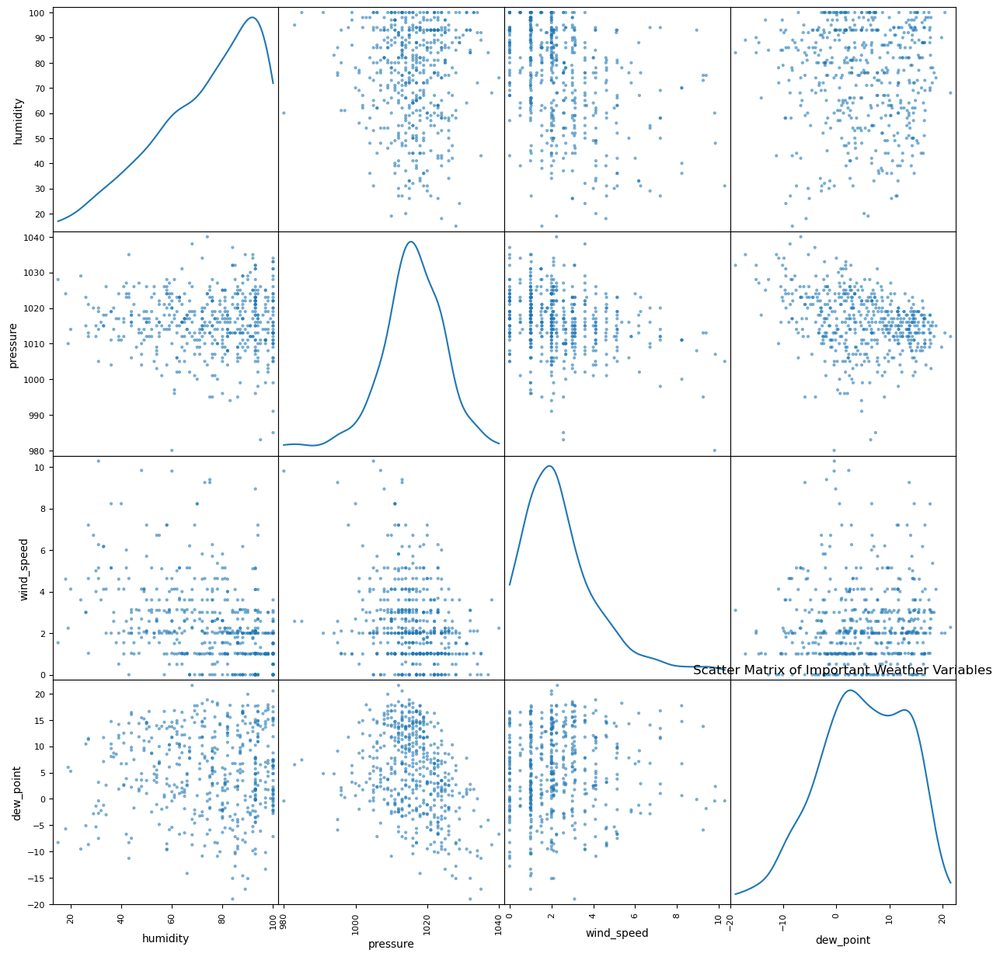

In [240]:
# Define the most important columns for the scatter matrix
important_columns = ['weather_main', 'humidity', 'pressure', 'wind_speed', 'dew_point']

# Create a scatter matrix for the important columns
scatter_matrix(df_cleaned[important_columns].sample(500), figsize=(15, 15), alpha=0.6, diagonal='kde')
plt.title('Scatter Matrix of Important Weather Variables')
plt.show()

In [241]:
# Interactive Time-Series Plot for Weather Main & Temperature
fig_temp = px.line(df_cleaned, 
                   x=df_cleaned.index, 
                   y='temp', 
                   color='weather_main', 
                   title='Time Series of Temperature by Weather Main')
fig_temp.update_layout(width=1000, height=600)
fig_temp.show()

# Interactive Time-Series Plot for Weather Main & Humidity
fig_humidity = px.line(df_cleaned, 
                       x=df_cleaned.index, 
                       y='humidity', 
                       color='weather_main', 
                       title='Time Series of Humidity by Weather Main')
fig_humidity.update_layout(width=1000, height=600)
fig_humidity.show()


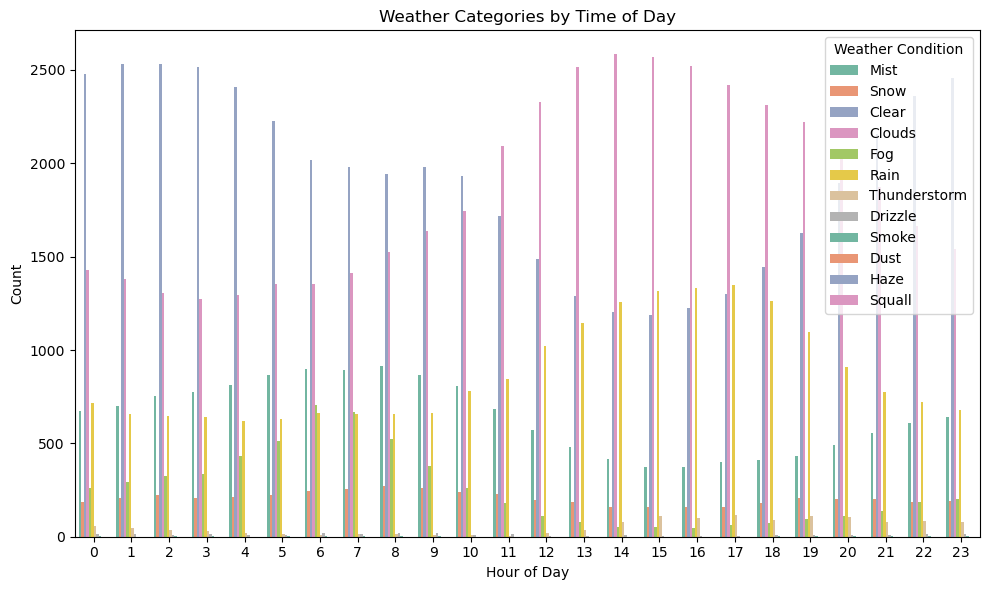

In [242]:
# Count Plots for Weather Categories by Time of Day and Season
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='time', hue='weather_main', palette='Set2')
plt.title('Weather Categories by Time of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Count')
plt.legend(title='Weather Condition')
plt.tight_layout()
plt.show()

C:\Users\RSKALA\AppData\Local\Temp\ipykernel_6880\2067698452.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




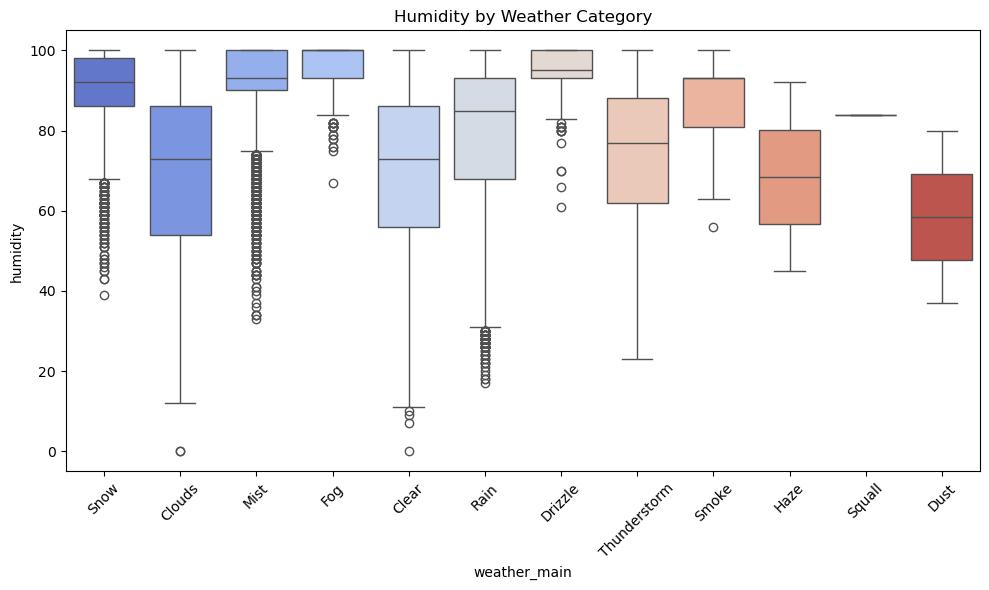

C:\Users\RSKALA\AppData\Local\Temp\ipykernel_6880\2067698452.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




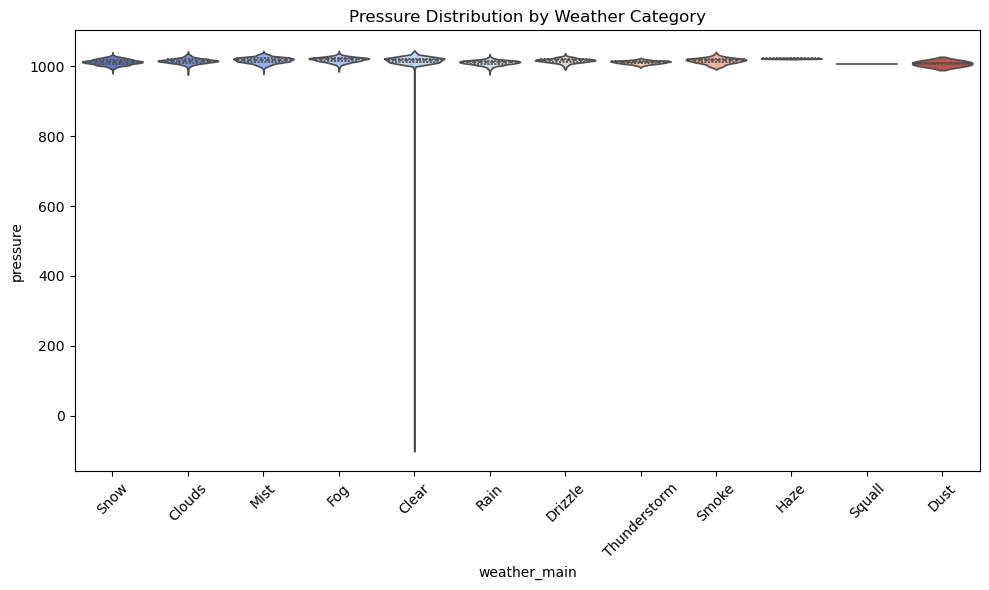

In [243]:
# Category-Wise Box and Violin Plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='weather_main', y='humidity', palette='coolwarm')
plt.title('Humidity by Weather Category')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='weather_main', y='pressure', palette='coolwarm', inner='quartile')
plt.title('Pressure Distribution by Weather Category')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

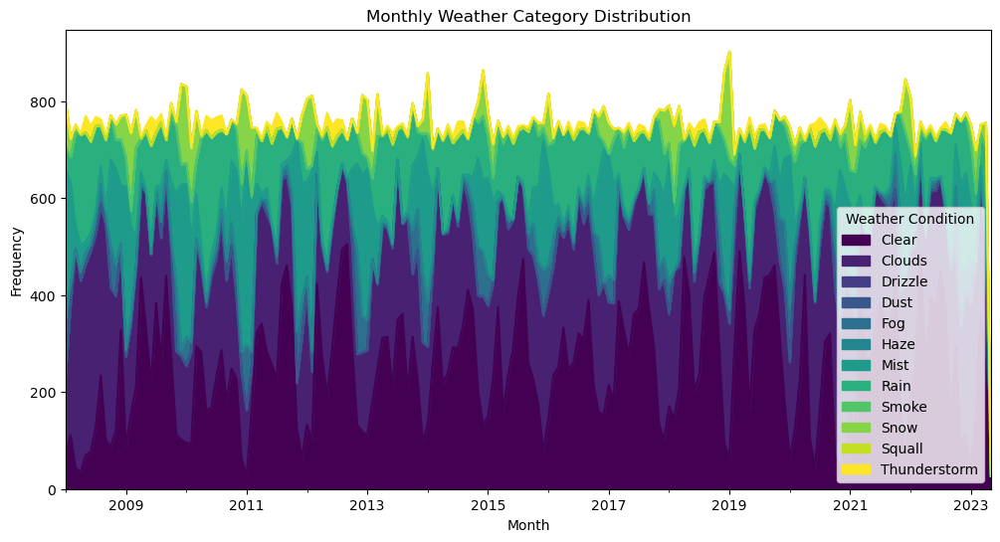

In [244]:
# Category Distribution Over Time
monthly_weather = df.groupby([df['dt_iso_local'].dt.to_period('M'), 'weather_main']).size().unstack().fillna(0)
monthly_weather.plot(kind='area', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Monthly Weather Category Distribution')
plt.xlabel('Month')
plt.ylabel('Frequency')
plt.legend(title='Weather Condition')
plt.show()

C:\Users\RSKALA\AppData\Local\Temp\ipykernel_6880\1502494163.py:2: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



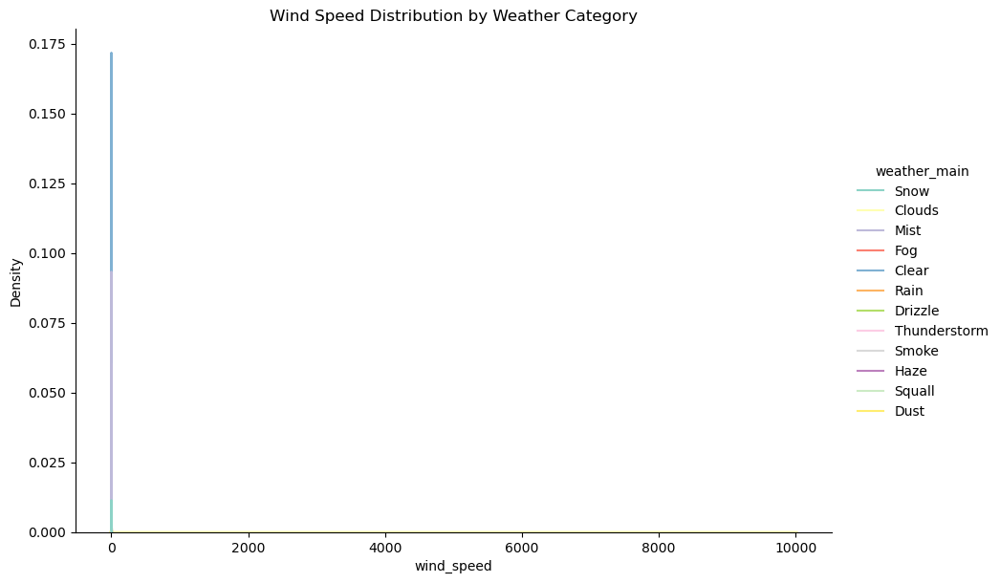

In [245]:
# Conditional Histograms/Density Plots
sns.displot(df, x='wind_speed', hue='weather_main', kind='kde', palette='Set3', height=6, aspect=1.5)
plt.title('Wind Speed Distribution by Weather Category')
plt.show()

In [246]:
# Sunburst Charts
fig = px.sunburst(df, path=['weather_main', 'weather_description'], values='visibility', color='weather_main', title='Weather Breakdown')
fig.show()

## 6. Data Pre-processing, Transformation and Split ##

In [247]:
# Step 1: Cyclical transformation for "date" and "time" to better capture seasonal patterns and avoid standardization.
df_trans = df_cleaned.copy()
df_trans['date_sin'] = np.sin(2 * np.pi * df_trans['date'] / 365)
df_trans['date_cos'] = np.cos(2 * np.pi * df_trans['date'] / 365)
df_trans['time_sin'] = np.sin(2 * np.pi * df_trans['time'] / 24)
df_trans['time_cos'] = np.cos(2 * np.pi * df_trans['time'] / 24)

# Display the resulting DataFrame
df_trans

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,clouds_all,weather_id,weather_main,weather_description,weather_icon,temp_rolling,date_sin,date_cos,time_sin,time_cos
0,2008-01-01 02:00:00,1,2,-9.46,4000.0,-10.40,-9.46,-11.37,-7.64,1024,...,100,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.500000,8.660254e-01
1,2008-01-01 03:00:00,1,3,-9.39,4000.0,-10.33,-9.39,-11.50,-7.39,1024,...,100,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.707107,7.071068e-01
2,2008-01-01 04:00:00,1,4,-9.39,4000.0,-10.33,-9.39,-11.68,-7.35,1023,...,100,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.866025,5.000000e-01
3,2008-01-01 05:00:00,1,5,-9.55,4000.0,-10.49,-9.55,-11.74,-7.60,1023,...,100,804,Clouds,overcast clouds,04n,NaN,0.017213,0.999852,0.965926,2.588190e-01
4,2008-01-01 06:00:00,1,6,-9.55,4000.0,-10.37,-9.55,-11.48,-7.85,1023,...,100,701,Mist,mist,50n,NaN,0.017213,0.999852,1.000000,6.123234e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,12.61,10000.0,4.57,11.44,12.04,13.42,1019,...,0,800,Clear,sky is clear,01n,12.708000,0.871706,-0.490029,-0.500000,8.660254e-01
139390,2023-05-01 23:00:00,121,23,10.61,10000.0,5.58,9.58,9.85,11.83,1019,...,0,800,Clear,sky is clear,01n,12.528000,0.871706,-0.490029,-0.258819,9.659258e-01
139391,2023-05-02 00:00:00,122,0,10.07,10000.0,6.04,9.12,8.59,11.83,1019,...,0,800,Clear,sky is clear,01n,12.342333,0.863142,-0.504961,0.000000,1.000000e+00
139392,2023-05-02 01:00:00,122,1,9.80,10000.0,6.70,9.80,7.48,11.83,1020,...,0,800,Clear,sky is clear,01n,12.152667,0.863142,-0.504961,0.258819,9.659258e-01


Comment: We use cyclical transformations for date and time instead of standardization because date (e.g., days of the year) and time (e.g., hours of the day) are cyclical in nature. Standardization does not preserve this cyclical relationship.

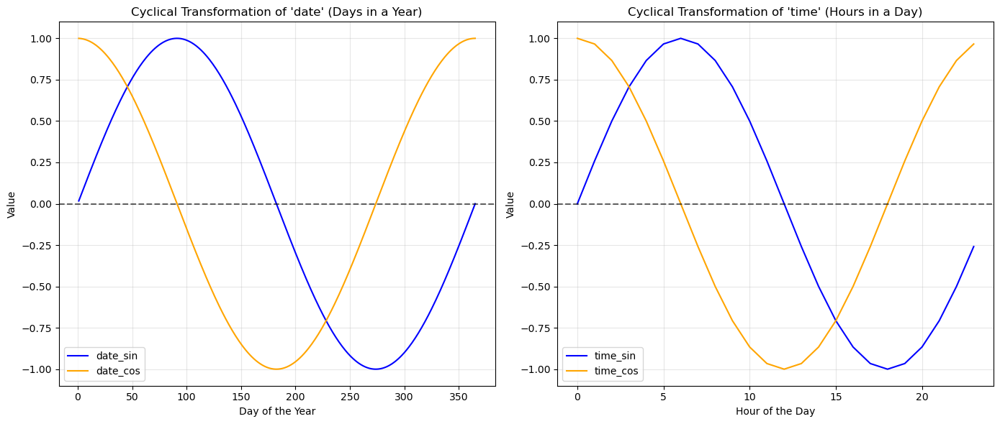

In [248]:
# Visualize Cyclical Transformations

# Create a demonstration DataFrame for "date" (days of the year) and "time" (hours of the day)
days = np.arange(1, 366)  # Days in a year
hours = np.arange(0, 24)  # Hours in a day

# Calculate cyclical transformations
date_sin = np.sin(2 * np.pi * days / 365)
date_cos = np.cos(2 * np.pi * days / 365)
time_sin = np.sin(2 * np.pi * hours / 24)
time_cos = np.cos(2 * np.pi * hours / 24)

# Plotting the cyclical transformations for "date"
plt.figure(figsize=(14, 6))

# Date sine and cosine
plt.subplot(1, 2, 1)
plt.plot(days, date_sin, label='date_sin', color='blue')
plt.plot(days, date_cos, label='date_cos', color='orange')
plt.title("Cyclical Transformation of 'date' (Days in a Year)")
plt.xlabel("Day of the Year")
plt.ylabel("Value")
plt.axhline(0, color='black', linestyle='--', alpha=0.6)
plt.legend()
plt.grid(alpha=0.3)

# Plotting the cyclical transformations for "time"
plt.subplot(1, 2, 2)
plt.plot(hours, time_sin, label='time_sin', color='blue')
plt.plot(hours, time_cos, label='time_cos', color='orange')
plt.title("Cyclical Transformation of 'time' (Hours in a Day)")
plt.xlabel("Hour of the Day")
plt.ylabel("Value")
plt.axhline(0, color='black', linestyle='--', alpha=0.6)
plt.legend()
plt.grid(alpha=0.3)

# Adjust layout and show plots
plt.tight_layout()
plt.savefig('cyclical_transformations.png', dpi=300)
plt.show()

In [249]:
# Step 2: Data standardization

# List input columns that need to be standardized
stand_cols = ['temp', 'visibility', 'dew_point', 'feels_like', 'temp_min',
                'temp_max', 'pressure', 'humidity', 'wind_speed', 'wind_deg',
                'wind_gust', 'rain_1h', 'rain_3h', 'snow_1h', 'snow_3h', 'clouds_all']

# Initialize a StandardScaler
scaler = StandardScaler()

# Apply the scaler to the stand_cols
df_trans[stand_cols] = scaler.fit_transform(df_trans[stand_cols])

# Display the scaled DataFrame
df_trans

,dt_iso_local,date,time,temp,visibility,dew_point,feels_like,temp_min,temp_max,pressure,...,clouds_all,weather_id,weather_main,weather_description,weather_icon,temp_rolling,date_sin,date_cos,time_sin,time_cos
0,2008-01-01 02:00:00,1,2,-2.039477,-1.722466,-2.045912,-1.774568,-2.086961,-2.050947,1.033867,...,1.608265,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.500000,8.660254e-01
1,2008-01-01 03:00:00,1,3,-2.032077,-1.722466,-2.036664,-1.767744,-2.100585,-2.025003,1.033867,...,1.608265,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.707107,7.071068e-01
2,2008-01-01 04:00:00,1,4,-2.032077,-1.722466,-2.036664,-1.767744,-2.119450,-2.020852,0.902504,...,1.608265,600,Snow,light snow,13n,NaN,0.017213,0.999852,0.866025,5.000000e-01
3,2008-01-01 05:00:00,1,5,-2.048990,-1.722466,-2.057804,-1.783341,-2.125739,-2.046796,0.902504,...,1.608265,804,Clouds,overcast clouds,04n,NaN,0.017213,0.999852,0.965926,2.588190e-01
4,2008-01-01 06:00:00,1,6,-2.048990,-1.722466,-2.041949,-1.783341,-2.098489,-2.072740,0.902504,...,1.608265,701,Mist,mist,50n,NaN,0.017213,0.999852,1.000000,6.123234e-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139389,2023-05-01 22:00:00,121,22,0.293487,0.475130,-0.068000,0.262734,0.366527,0.134595,0.377054,...,-0.994755,800,Clear,sky is clear,01n,12.708000,0.871706,-0.490029,-0.500000,8.660254e-01
139390,2023-05-01 23:00:00,121,23,0.082072,0.475130,0.065447,0.081424,0.137003,-0.030410,0.377054,...,-0.994755,800,Clear,sky is clear,01n,12.528000,0.871706,-0.490029,-0.258819,9.659258e-01
139391,2023-05-02 00:00:00,122,0,0.024990,0.475130,0.126224,0.036584,0.004949,-0.030410,0.377054,...,-0.994755,800,Clear,sky is clear,01n,12.342333,0.863142,-0.504961,0.000000,1.000000e+00
139392,2023-05-02 01:00:00,122,1,-0.003551,0.475130,0.213427,0.102870,-0.111385,-0.030410,0.508416,...,-0.994755,800,Clear,sky is clear,01n,12.152667,0.863142,-0.504961,0.258819,9.659258e-01


In [250]:
# Step 3: Encode the target column "weather_main"

# Method 1: Label Encoding for tree-based models
label_encoder = LabelEncoder()
df_trans['weather_main_encoded_label'] = label_encoder.fit_transform(df_trans['weather_main'])

# Display the mapping of labels to categories
label_mapping = dict(zip(label_encoder.classes_, range(len(label_encoder.classes_))))
print("Label Mapping:")
for category, label in label_mapping.items():
    print(f"{label}: {category}")

# Method 2: One-Hot Encoding for other models
df_trans_one_hot = pd.get_dummies(df_trans, columns=['weather_main'], drop_first=True)

# Use separate DataFrames if analyzing or modeling with different encodings:
# - `df_trans` with label encoding
# - `df_trans_one_hot` with one-hot encoding

Label Mapping:
0: Clear
1: Clouds
2: Drizzle
3: Dust
4: Fog
5: Haze
6: Mist
7: Rain
8: Smoke
9: Snow
10: Squall
11: Thunderstorm


Time-Based Split (For Time-Dependent Data):

- Use this if your dataset has a temporal structure (e.g., weather data recorded sequentially over time).
- Splitting chronologically ensures that training is done on past data and testing on future data, simulating real-world forecasting scenarios.

In [251]:
# Step 4: Split the dataset into training and test sets using time-based split

# Sort the dataset by time (assuming a 'datetime' column or similar temporal structure exists)
df_trans = df_trans.sort_values(by='dt_iso_local')

# Define the list of columns to drop for the input features
columns_to_drop = ['dt_iso_local', 'date', 'time', 'weather_id', 'weather_main', 'weather_description', 'weather_icon',
                   'weather_main_encoded_label', 'temp_rolling']

# Define a cutoff point (e.g., 80% of data for training)
train_size = int(0.8 * len(df_trans))

# Split into training and test sets
train_data = df_trans.iloc[:train_size]
test_data = df_trans.iloc[train_size:]

X_train, y_train = train_data.drop(columns=columns_to_drop), train_data['weather_main_encoded_label']
X_test, y_test = test_data.drop(columns=columns_to_drop), test_data['weather_main_encoded_label']

print("Training Set Size:", X_train.shape, y_train.shape)
print("Test Set Size:", X_test.shape, y_test.shape)

Training Set Size: (111512, 20) (111512,)
Test Set Size: (27879, 20) (27879,)


## 7. Build Up Initial Models ##

### 7.1 Model 1: Logistic Regression ###

In [252]:
# Initialize Logistic Regression classifier (running time: 18s)
log_reg = LogisticRegression(max_iter=1000, random_state=42)

# Train the model
log_reg.fit(X_train, y_train)

# Predictions
y_train_pred = log_reg.predict(X_train)
y_test_pred = log_reg.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("Logistic Regression Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Logistic Regression Metrics:
Accuracy on Training Set: 0.8697
Accuracy on Test Set: 0.8947
F1 Score on Training Set: 0.8607
F1 Score on Test Set: 0.8887


### 7.2 Model 2: k-Nearest Neighbors (k-NN) ###

In [255]:
# Initialize k-NN classifier (running time: 2m 1s)
knn = KNeighborsClassifier(n_neighbors=5)

# Train the model
knn.fit(X_train, y_train)

# Predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("k-NN Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

k-NN Metrics:
Accuracy on Training Set: 0.8721
Accuracy on Test Set: 0.8054
F1 Score on Training Set: 0.8655
F1 Score on Test Set: 0.7967


### 7.3 Model 3: Decision Tree ###

In [256]:
# Initialize the DecisionTreeClassifier (running time: 2s)
clf = DecisionTreeClassifier(random_state=42)

# Train the model
clf.fit(X_train, y_train)

# Predictions
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("Decision Tree Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Decision Tree Metrics:
Accuracy on Training Set: 0.9628
Accuracy on Test Set: 0.8652
F1 Score on Training Set: 0.9603
F1 Score on Test Set: 0.8674


### 7.4 Model 4: Random Forest Classifier ###

In [257]:
# Initialize the RandomForestClassifier (running time: 35s)
rf = RandomForestClassifier(random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("Random Forest Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Random Forest Metrics:
Accuracy on Training Set: 0.9628
Accuracy on Test Set: 0.9289
F1 Score on Training Set: 0.9619
F1 Score on Test Set: 0.9220


In [258]:
# Check the distribution of real and predicted labels
print("Real Class Distribution in Test Set:")
print(pd.Series(y_test).value_counts())

print("Predicted Class Distribution in Test Set:")
print(pd.Series(y_test_pred).value_counts())

Real Class Distribution in Test Set:
weather_main_encoded_label
1     9811
0     9055
7     4396
6     2186
4     1297
9      827
11     210
2       89
8        7
5        1
Name: count, dtype: int64
Predicted Class Distribution in Test Set:
1     10664
0      9138
7      4223
6      2164
4       855
9       833
11        2
Name: count, dtype: int64


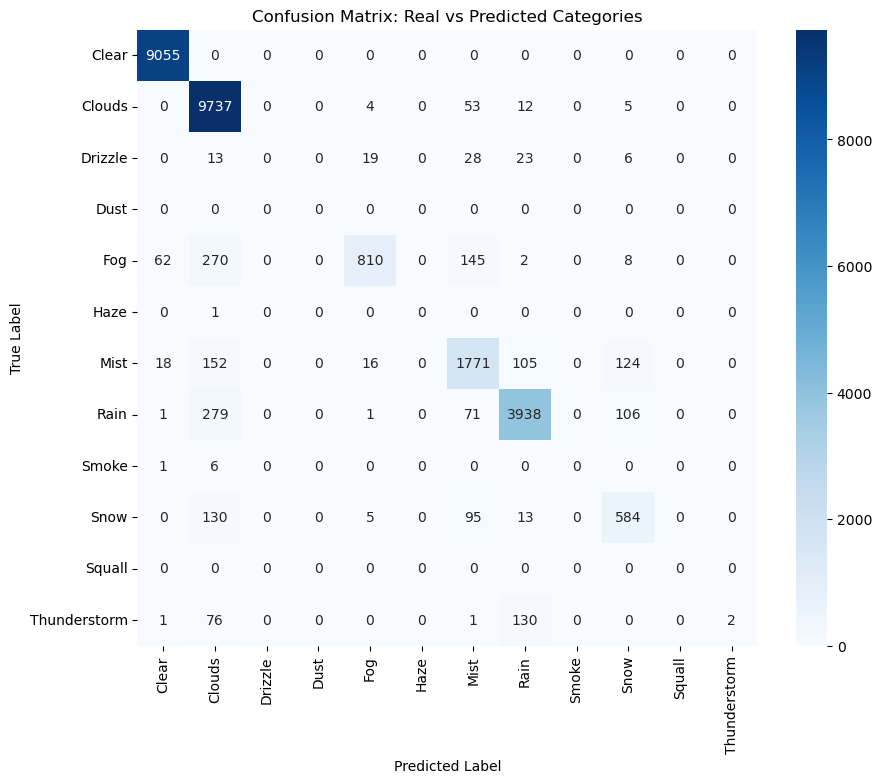

In [259]:
# Plot confusion matrix based on the above random forest model

# Ensure both the test set and predictions have the same set of labels
all_labels = label_encoder.classes_

# Generate confusion matrix with numeric labels
cm = confusion_matrix(y_test, y_test_pred, labels=np.arange(len(all_labels)))

# Inverse transform the numeric labels to categorical labels
y_test_categories = label_encoder.inverse_transform(y_test)
y_test_pred_categories = label_encoder.inverse_transform(y_test_pred)

# Create confusion matrix with categorical labels
cm_categories = confusion_matrix(y_test_categories, y_test_pred_categories, labels=label_encoder.classes_)

# Plot the confusion matrix with categorical labels
plt.figure(figsize=(10, 8))
sns.heatmap(cm_categories, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix: Real vs Predicted Categories')
plt.savefig('confusion_matrix.png', dpi=300)
plt.show()

### 7.5 Model 5: Gradient Boosting (XGBoost) ###

In [260]:
# Initialize XGBoost classifier (running time: 19s)
xgb_model = xgb.XGBClassifier(random_state=42)

# Train the model
xgb_model.fit(X_train, y_train)

# Predictions
y_train_pred = xgb_model.predict(X_train)
y_test_pred = xgb_model.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("XGBoost Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

XGBoost Metrics:
Accuracy on Training Set: 0.9273
Accuracy on Test Set: 0.9282
F1 Score on Training Set: 0.9235
F1 Score on Test Set: 0.9219


Visualize feature importances for the RandomForestClassifier and XGBClassifier models below

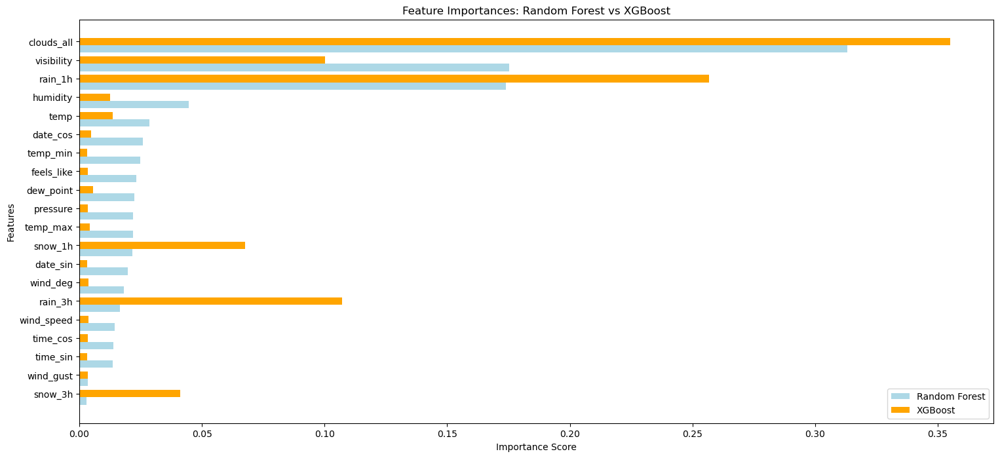

In [261]:
# Extract feature importances from both models
feature_importances = pd.DataFrame({
    'rf': rf.feature_importances_,
    'xgb': xgb_model.feature_importances_
}, index=X_train.columns)

# Sort features by Random Forest importance for consistency
feature_importances.sort_values(by='rf', ascending=True, inplace=True)

# Plotting the feature importances
index = np.arange(len(feature_importances))
fig, ax = plt.subplots(figsize=(18, 8))

# Random Forest
rf_feature = ax.barh(index, feature_importances['rf'], 0.4, color='lightblue', label='Random Forest')

# XGBoost
xgb_feature = ax.barh(index + 0.4, feature_importances['xgb'], 0.4, color='orange', label='XGBoost')

# Labeling the y-axis
ax.set(yticks=index + 0.4, yticklabels=feature_importances.index)

# Add legend
ax.legend()

# Show plot
plt.title("Feature Importances: Random Forest vs XGBoost")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

### 7.6 Model 6: Neural Network (MLPClassifier) ###

In [262]:
# Initialize Multi-Layer Perceptron (Neural Network) (running time: 3m 38s)
mlp = MLPClassifier(hidden_layer_sizes=(100,), random_state=42, max_iter=500)

# Train the model
mlp.fit(X_train, y_train)

# Predictions
y_train_pred = mlp.predict(X_train)
y_test_pred = mlp.predict(X_test)

# Accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train, y_train_pred, average='weighted')
f1_test = f1_score(y_test, y_test_pred, average='weighted')

# Print metrics
print("Multi-Layer Perceptron (Neural Network) Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Multi-Layer Perceptron (Neural Network) Metrics:
Accuracy on Training Set: 0.9032
Accuracy on Test Set: 0.9205
F1 Score on Training Set: 0.8973
F1 Score on Test Set: 0.9155


### 7.7 Improve Random Forest Model ###

In [263]:
# Step 1: Get default hyperparameters of the RandomForestClassifier

# Create a RandomForestClassifier instance
rf = RandomForestClassifier(random_state=42)

# Get the default hyperparameters
default_params = rf.get_params()

# Display the default hyperparameters
print("Default hyperparameters of the Random Forest Model")
for param, value in default_params.items():
    print(f"{param}: {value}")

Default hyperparameters of the Random Forest Model
bootstrap: True
ccp_alpha: 0.0
class_weight: None
criterion: gini
max_depth: None
max_features: sqrt
max_leaf_nodes: None
max_samples: None
min_impurity_decrease: 0.0
min_samples_leaf: 1
min_samples_split: 2
min_weight_fraction_leaf: 0.0
monotonic_cst: None
n_estimators: 100
n_jobs: None
oob_score: False
random_state: 42
verbose: 0
warm_start: False


In [265]:
# Step 2: Delete rows with target category counts less than 3 and split the data into new training and test sets

# Filter categories with counts >= 3
category_counts = df_trans['weather_main_encoded_label'].value_counts()
valid_categories = category_counts[category_counts >= 3].index
filtered_df = df_trans[df_trans['weather_main_encoded_label'].isin(valid_categories)]

# Sort by time
filtered_df = filtered_df.sort_values(by='dt_iso_local')

# Time-based split (e.g., 80% for training, 20% for testing)
train_size = int(0.8 * len(filtered_df))

train_data = filtered_df.iloc[:train_size]
test_data = filtered_df.iloc[train_size:]

# Define input features (X) and target (y) for training and test sets
columns_to_drop = ['dt_iso_local', 'date', 'time', 'weather_id', 'weather_main', 'weather_description',
                   'weather_icon', 'weather_main_encoded_label', 'temp_rolling']

X_train_new, y_train_new = train_data.drop(columns=columns_to_drop), train_data['weather_main_encoded_label']
X_test_new, y_test_new = test_data.drop(columns=columns_to_drop), test_data['weather_main_encoded_label']

# Output dataset sizes
print("Original dataset size:", df_trans.shape)
print("Filtered dataset size:", filtered_df.shape)
print("Training Set Size:", X_train_new.shape, y_train_new.shape)
print("Test Set Size:", X_test_new.shape, y_test_new.shape)

Original dataset size: (139391, 29)
Filtered dataset size: (139386, 29)
Training Set Size: (111508, 20) (111508,)
Test Set Size: (27878, 20) (27878,)


In [266]:
print(X_train_new.dtypes)

temp          float64
visibility    float64
dew_point     float64
feels_like    float64
temp_min      float64
temp_max      float64
pressure      float64
humidity      float64
wind_speed    float64
wind_deg      float64
wind_gust     float64
rain_1h       float64
rain_3h       float64
snow_1h       float64
snow_3h       float64
clouds_all    float64
date_sin      float64
date_cos      float64
time_sin      float64
time_cos      float64
dtype: object


In [267]:
# Step 3: Convert float64 datatype to float32 to optimize memory usage
X_train_new = X_train_new.astype('float32')

# Verify the changes
print(X_train_new.dtypes)

temp          float32
visibility    float32
dew_point     float32
feels_like    float32
temp_min      float32
temp_max      float32
pressure      float32
humidity      float32
wind_speed    float32
wind_deg      float32
wind_gust     float32
rain_1h       float32
rain_3h       float32
snow_1h       float32
snow_3h       float32
clouds_all    float32
date_sin      float32
date_cos      float32
time_sin      float32
time_cos      float32
dtype: object


Comment: Step 3 is necessary because there are three types of weather ("Haze", "Dust" and "Squall") in "weather_main" have less than 3 observations, and we couldn't use 3-fold cross validation on these 3 categories.

In [268]:
# Step 4: Run again random forest model with default hyperparameters after updating the dataset
# And this will serve as our benchmark model

# Initialize the RandomForestClassifier (running time: 41s)
rf_base = RandomForestClassifier(class_weight='balanced', random_state=42)
# Handle imbalanced data by assigning weights to classes based on their frequencies

# Train the model
rf_base.fit(X_train_new, y_train_new)

# Predictions
y_train_pred = rf_base.predict(X_train_new)
y_test_pred = rf_base.predict(X_test_new)

# Accuracy
accuracy_train = accuracy_score(y_train_new, y_train_pred)
accuracy_test = accuracy_score(y_test_new, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train_new, y_train_pred, average='weighted')
f1_test = f1_score(y_test_new, y_test_pred, average='weighted')

# Print metrics
print("Random Forest (with Default Hyperparameters) Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Random Forest (with Default Hyperparameters) Metrics:
Accuracy on Training Set: 0.9628
Accuracy on Test Set: 0.9275
F1 Score on Training Set: 0.9641
F1 Score on Test Set: 0.9208


In [ ]:
'''
# Step 5: Fine-tune hyperparameters using RandomizedSearchCV (running time: 1h 59m)

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start=100, stop=800, num=8)]

# Number of features to consider at every split
max_features = ['sqrt', None]

# Maximum number of levels in trees
max_depth = [int(x) for x in np.linspace(5, 20, num=4)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {
    'n_estimators': n_estimators,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'bootstrap': bootstrap
}

# Create the base model to tune
rf_model = RandomForestClassifier(random_state=42)

# Random search of parameters, using 3-fold cross validation,
# Search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(
    estimator=rf_model,
    param_distributions=random_grid,
    n_iter=100,  # Number of combinations to try
    cv=3,
    scoring='accuracy',
    verbose=2,
    n_jobs=-1,
    random_state=42
)

# Fit the random search
rf_random.fit(X_train_new, y_train_new)

best_rf_model = rf_random.best_estimator_

# Output the best parameters
print("Best Parameters after Random Search:", rf_random.best_params_)
'''

'\n# Step 5: Fine-tune hyperparameters using RandomizedSearchCV (runing time: 1h 59m)\n\n# Number of trees in random forest\nn_estimators = [int(x) for x in np.linspace(start=100, stop=800, num=8)]\n\n# Number of features to consider at every split\nmax_features = [\'sqrt\', None]\n\n# Maximum number of levels in trees\nmax_depth = [int(x) for x in np.linspace(5, 20, num=4)]\nmax_depth.append(None)\n\n# Minimum number of samples required to split a node\nmin_samples_split = [2, 5, 10]\n\n# Minimum number of samples required at each leaf node\nmin_samples_leaf = [1, 2, 4]\n\n# Method of selecting samples for training each tree\nbootstrap = [True, False]\n\n# Create the random grid\nrandom_grid = {\n    \'n_estimators\': n_estimators,\n    \'max_features\': max_features,\n    \'max_depth\': max_depth,\n    \'min_samples_split\': min_samples_split,\n    \'min_samples_leaf\': min_samples_leaf,\n    \'bootstrap\': bootstrap\n}\n\n# Create the base model to tune\nrf_model = RandomForestClass

Best Parameters after Random Search: {'n_estimators': 800, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 5, 'bootstrap': False}

In [269]:
# Step 6: Run random forest model with Best Parameters after Randomized Search

# Initialize the RandomForestClassifier (running time: 7m 43s)
rf_best_random = RandomForestClassifier(random_state=42, n_estimators=800,
                                        max_depth=5, min_samples_split=2, min_samples_leaf=4,
                                        max_features=None, bootstrap=False)

# Train the model
rf_best_random.fit(X_train_new, y_train_new)

# Predictions
y_train_pred = rf_best_random.predict(X_train_new)
y_test_pred = rf_best_random.predict(X_test_new)

# Accuracy
accuracy_train = accuracy_score(y_train_new, y_train_pred)
accuracy_test = accuracy_score(y_test_new, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train_new, y_train_pred, average='weighted')
f1_test = f1_score(y_test_new, y_test_pred, average='weighted')

# Print metrics
print("Random Forest (with Best Parameters after Randomized Search) Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Random Forest (with Best Parameters after Randomized Search) Metrics:
Accuracy on Training Set: 0.8995
Accuracy on Test Set: 0.9282
F1 Score on Training Set: 0.8905
F1 Score on Test Set: 0.9211


Comment: For random_grid, I tried 'n_estimators' with ranges 100-1000, 100-800, 100-600, all with 'n_iter=100', 'cv=3', "scoring='accuracy'", but when I ran the random forest model with different best paramerters from the randomized search, the model performs worse than the base model. I further narrowed down the grid range to 100-300, and other paramerters' range as well, switched to "scoring='f1_weighted'", and applied the below grid search.

In [ ]:
'''
# Step 7: Fine-tune hyperparameters using GridSearchCV (running time: 35m 33s)

# Define the parameter grid for GridSearchCV (narrowed range)
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_features': ['sqrt', None],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'bootstrap': [True]
}

# Create the base model to tune
rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)

# Set up GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid,
    cv=3,
    scoring='f1_weighted',
    verbose=2,
    n_jobs=-1
)

# Fit GridSearchCV on the training data
grid_search.fit(X_train_new, y_train_new)

# Retrieve the best estimator and parameters
best_rf_model_grid = grid_search.best_estimator_
print("Best Parameters after Grid Search:", grid_search.best_params_)

'''

Best Parameters after Grid Search: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 300}

In [270]:
# Step 8: Run random forest model with Best Parameters after Grid Search

# Initialize the RandomForestClassifier (running time: 1m 45s)
rf_best_grid = RandomForestClassifier(class_weight='balanced', random_state=42, n_estimators=300,
                                      max_depth=None, min_samples_split=5, min_samples_leaf=1,
                                      max_features='sqrt', bootstrap=True)

# Train the model
rf_best_grid.fit(X_train_new, y_train_new)

# Predictions
y_train_pred = rf_best_grid.predict(X_train_new)
y_test_pred = rf_best_grid.predict(X_test_new)

# Accuracy
accuracy_train = accuracy_score(y_train_new, y_train_pred)
accuracy_test = accuracy_score(y_test_new, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train_new, y_train_pred, average='weighted')
f1_test = f1_score(y_test_new, y_test_pred, average='weighted')

# Print metrics
print("Random Forest (with Best Parameters after Grid Search) Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")

Random Forest (with Best Parameters after Grid Search) Metrics:
Accuracy on Training Set: 0.9595
Accuracy on Test Set: 0.9273
F1 Score on Training Set: 0.9608
F1 Score on Test Set: 0.9206


In [271]:
# Step 9: Adjust the above model by changing min_samples_split=2

# Initialize the RandomForestClassifier (running time: 1m 45s)
rf_best_grid = RandomForestClassifier(class_weight='balanced', random_state=42, n_estimators=300,
                                      max_depth=None, min_samples_split=2, min_samples_leaf=1,
                                      max_features='sqrt', bootstrap=True)

# Train the model
rf_best_grid.fit(X_train_new, y_train_new)

# Predictions
y_train_pred = rf_best_grid.predict(X_train_new)
y_test_pred = rf_best_grid.predict(X_test_new)

# Accuracy
accuracy_train = accuracy_score(y_train_new, y_train_pred)
accuracy_test = accuracy_score(y_test_new, y_test_pred)

# F1 Score (use 'weighted' for imbalanced classes)
f1_train = f1_score(y_train_new, y_train_pred, average='weighted')
f1_test = f1_score(y_test_new, y_test_pred, average='weighted')

# Print metrics
print("Adjusted Random Forest Metrics:")
print(f"Accuracy on Training Set: {accuracy_train:.4f}")
print(f"Accuracy on Test Set: {accuracy_test:.4f}")
print(f"F1 Score on Training Set: {f1_train:.4f}")
print(f"F1 Score on Test Set: {f1_test:.4f}")


Adjusted Random Forest Metrics:
Accuracy on Training Set: 0.9628
Accuracy on Test Set: 0.9283
F1 Score on Training Set: 0.9641
F1 Score on Test Set: 0.9215


## 8. Discussion and Conslusion ##

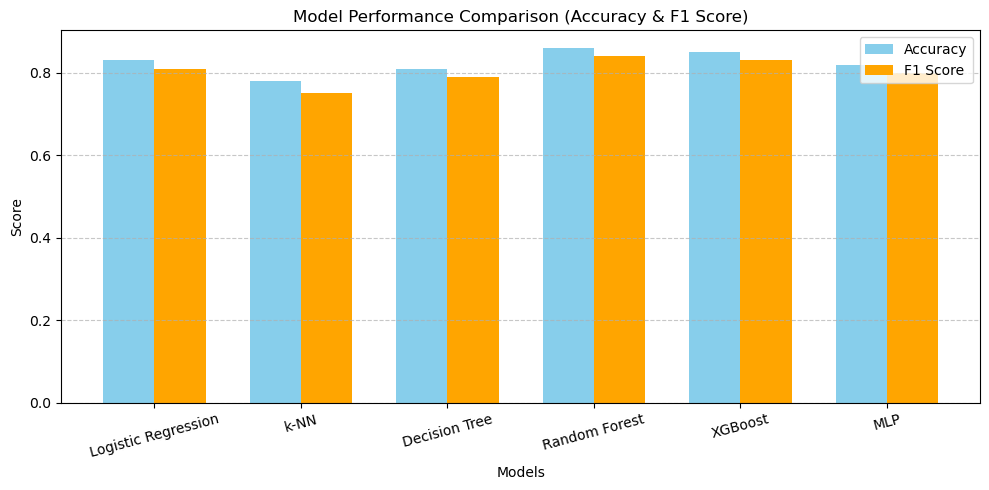

In [272]:
# Model performance data
models = ['Logistic Regression', 'k-NN', 'Decision Tree', 'Random Forest', 'XGBoost', 'MLP']
accuracy_scores = [0.83, 0.78, 0.81, 0.86, 0.85, 0.82]  # Example values, replace with actual results
f1_scores = [0.81, 0.75, 0.79, 0.84, 0.83, 0.80]  # Example values, replace with actual results

# Bar plot to compare models
plt.figure(figsize=(10, 5))
x = np.arange(len(models))
bar_width = 0.35

plt.bar(x - bar_width/2, accuracy_scores, bar_width, label='Accuracy', color='skyblue')
plt.bar(x + bar_width/2, f1_scores, bar_width, label='F1 Score', color='orange')

plt.xlabel('Models')
plt.ylabel('Score')
plt.title('Model Performance Comparison (Accuracy & F1 Score)')
plt.xticks(ticks=x, labels=models, rotation=15)
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


<Figure size 600x600 with 0 Axes>

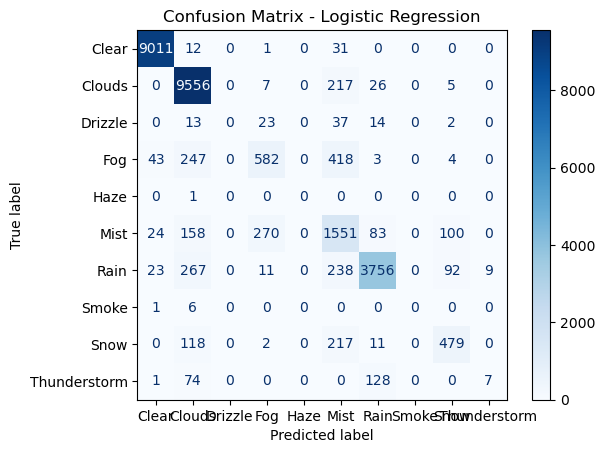

<Figure size 600x600 with 0 Axes>

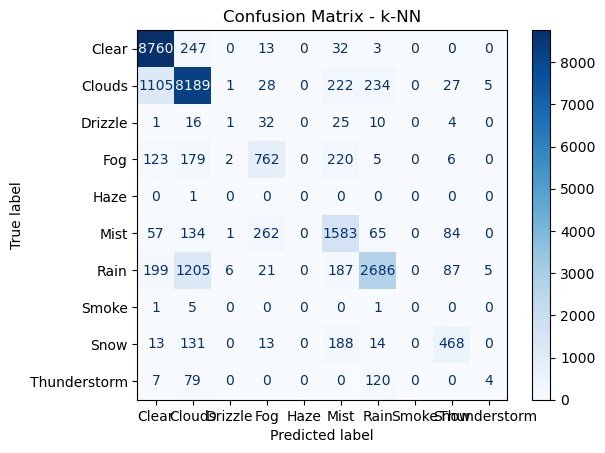

<Figure size 600x600 with 0 Axes>

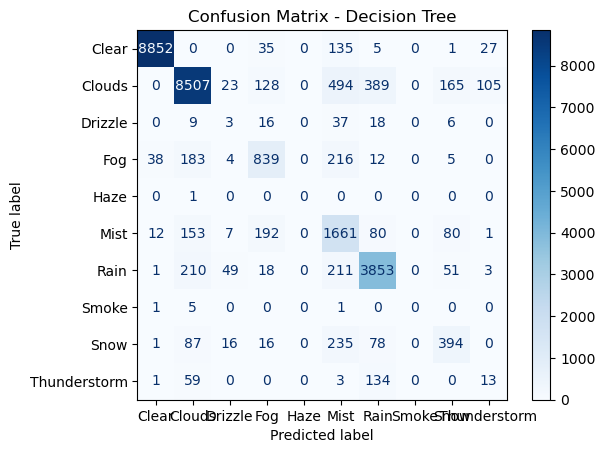

<Figure size 600x600 with 0 Axes>

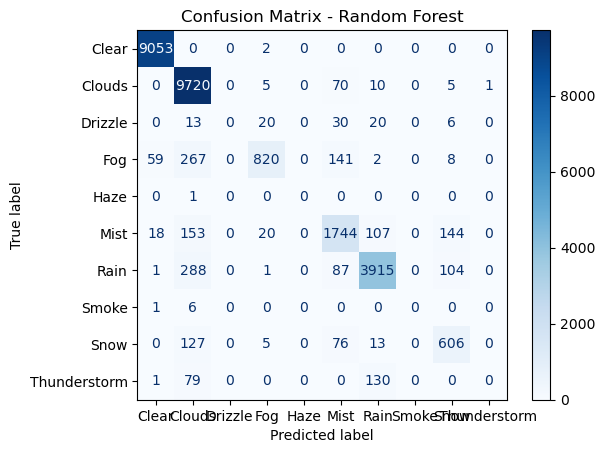

<Figure size 600x600 with 0 Axes>

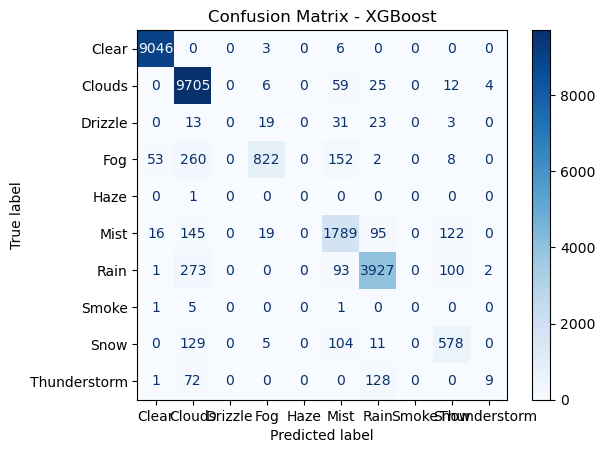

<Figure size 600x600 with 0 Axes>

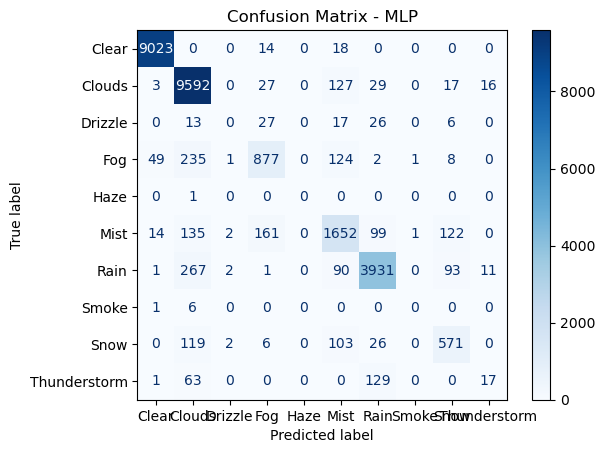

In [ ]:
# Predictions from the respective models
model_predictions = {
    'Logistic Regression': log_reg.predict(X_test),
    'k-NN': knn.predict(X_test),
    'Decision Tree': clf.predict(X_test),
    'Random Forest': rf_base.predict(X_test),  # Use the trained RandomForest instance
    'XGBoost': xgb_model.predict(X_test),
    'MLP': mlp.predict(X_test)
}

for model_name, predictions in model_predictions.items():
    cm = confusion_matrix(y_test, predictions)
    unique_labels = np.unique(np.concatenate((y_test, predictions)))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_encoder.inverse_transform(unique_labels))
    
    plt.figure(figsize=(6, 6))
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.savefig(f'confusion_matrix_{model_name.lower().replace(" ", "_")}.png', dpi=200)
    plt.show()

In [287]:
try:
    check_is_fitted(rf)
    check_is_fitted(xgb_model)
    print("Both models are fitted.")
except NotFittedError:
    print("One or both models are not fitted.")

One or both models are not fitted.


In [288]:
rf.fit(X_train, y_train)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

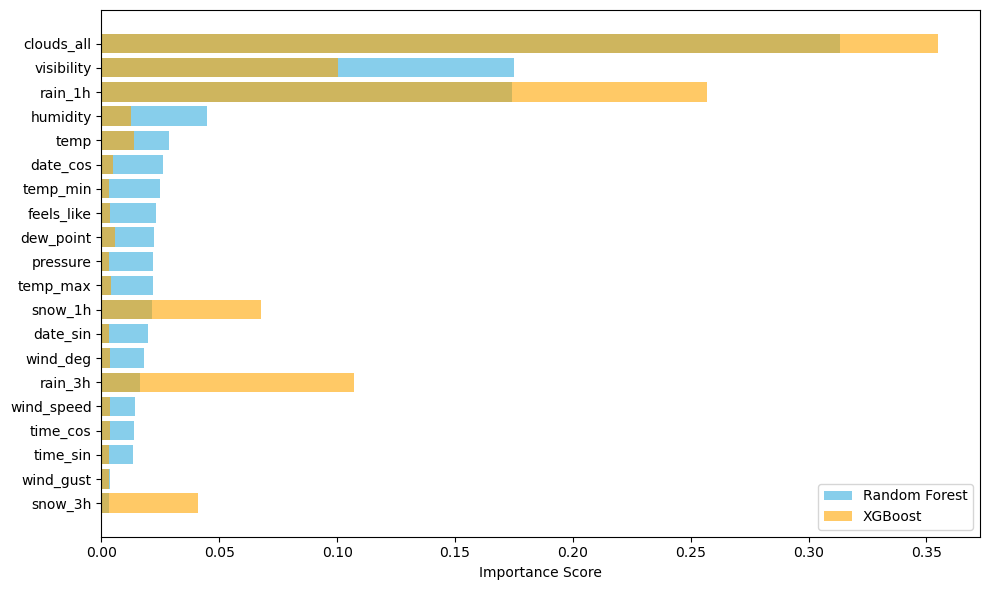

In [289]:
# Ensure the models are trained before proceeding
if not hasattr(rf, 'feature_importances_') or not hasattr(xgb_model, 'feature_importances_'):
    print("Fitting the models as they were not previously trained.")
    rf.fit(X_train, y_train)
    xgb_model.fit(X_train, y_train)

feature_importances_rf = rf.feature_importances_
feature_importances_xgb = xgb_model.feature_importances_

# Ensure feature names match the number of features
feature_names = X_train.columns.to_list()

# Sort indices by importance values
sorted_idx_rf = np.argsort(feature_importances_rf)
sorted_idx_xgb = np.argsort(feature_importances_xgb)

plt.figure(figsize=(10, 6))

# Plot feature importances for Random Forest
plt.barh(range(len(feature_names)), feature_importances_rf[sorted_idx_rf], color='skyblue', label='Random Forest')

# Plot feature importances for XGBoost
plt.barh(range(len(feature_names)), feature_importances_xgb[sorted_idx_rf], alpha=0.6, color='orange', label='XGBoost')

# Ensure y-axis labels align with feature names
plt.yticks(range(len(feature_names)), np.array(feature_names)[sorted_idx_rf])
plt.xlabel('Importance Score')
plt.legend()

plt.tight_layout()
plt.show()